# Unzip the Data

In [ ]:
from zipfile import ZipFile
ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/OfflineHWtext (1).zip", "r")
ref.extractall()
ref.close()

In [ ]:
from zipfile import ZipFile
ref = ZipFile('/content/drive/MyDrive/HandWritingRecognition/WI_Test.zip', 'r')
ref.extractall()
ref.close()

## Deskew Images

In [ ]:
from skimage.io import imread
from skimage.io import imsave
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.util import invert
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from skimage.transform import rotate
import os
import shutil

In [ ]:
## Move train and test data in one folder
basePath = "/content/Test"
for file in os.listdir(basePath):
  # print(file)
  fileNumber = os.path.splitext(file)[0].split('_')[1]
  if fileNumber == '006' or fileNumber == '005':
    pass
  else:
    shutil.move(basePath + '/' + file, '/content/OfflineHWtext')

In [ ]:
#find the horizontal projection of all the rows in the image
#rotate the image between angles -10 to 10 degrees and find the angle which gives the least median of horizontal projection
def horizontal_projections(sobel_image):
  sum_of_cols = []
  rows,cols = sobel_image.shape
  for row in range(rows-1):
    sum_of_cols.append(np.sum(sobel_image[row,:]))
    
  return sum_of_cols

In [ ]:
def deskewImages(fileName, srcFolder, destFolder):
    orgFilePath = os.path.join(srcFolder, fileName)
    orgImageFile = imread(orgFilePath)
    wrkImage = orgImageFile
    img = rgb2gray(wrkImage)
   
    # plt.imshow(img, cmap="gray")

    img = invert(sobel(img))
    # plt.imshow(sobel_image)

    rows,cols = img.shape
    predicted_angle = 0
    highest_hp = 0
    for index,angle in enumerate(range(-10,10)):
      hp = horizontal_projections(rotate(img, angle, cval=1))
      median_hp = np.median(hp)
      if highest_hp < median_hp:
        predicted_angle = angle
        highest_hp = median_hp
      
    # fig, ax = plt.subplots(ncols=2, figsize=(20,10))
    # ax[0].set_title('original image grayscale')
    # ax[0].imshow(img, cmap="gray")
    # ax[1].set_title('original image rotated by angle'+str(predicted_angle))
    # ax[1].imshow(rotate(orgImageFile, predicted_angle, cval=1))

  
    rotatedImage = rotate(orgImageFile, predicted_angle, cval=1)
    print(f'File Name:{fileName} Angle:{predicted_angle}')
    # # plt.imshow(rotatedImage)
    # print("original image")
    # plt.figure()

    # cv2_imshow(rotatedImage)
    if predicted_angle == 0:
      shutil.copy(orgFilePath, destFolder)
    elif abs(predicted_angle) > 3:
      filePath = os.path.join(destFolder, fileName)
      imsave(filePath, orgImageFile)
      # cv2.imwrite(filePath, orgImageFile)
    else:
      filePath = os.path.join(destFolder, fileName)
      imsave(filePath, rotatedImage)
      # cv2.imwrite(filePath, rotatedImage)

In [ ]:
!rm -rf /content/deskewedImages

In [ ]:
os.mkdir("deskewedImages")
destFolder = "/content/deskewedImages"
srcFolder = "/content/OfflineHWtext"

In [ ]:
totalFile = len(os.listdir('/content/OfflineHWtext'))
count = 0
for file in os.listdir(srcFolder):
    deskewImages(file, srcFolder, destFolder)
    count +=1 
    print("Remaining:", (totalFile - count))
    # break
    # if count == 3:
    #   break

File Name:022_001.png Angle:0
Remaining: 219
File Name:021_004.png Angle:0
Remaining: 218
File Name:030_004.png Angle:0
Remaining: 217
File Name:049_004.png Angle:0
Remaining: 216


File Name:008_001.png Angle:-1
Remaining: 215
File Name:055_004.png Angle:0
Remaining: 214


File Name:018_002.png Angle:-2
Remaining: 213
File Name:014_002.png Angle:0
Remaining: 212
File Name:011_001.png Angle:0
Remaining: 211
File Name:071_002.png Angle:0
Remaining: 210
File Name:011_004.png Angle:0
Remaining: 209


File Name:008_002.png Angle:1
Remaining: 208


File Name:042_002.png Angle:-1
Remaining: 207


File Name:069_002.png Angle:1
Remaining: 206
File Name:051_002.png Angle:0
Remaining: 205


File Name:008_003.png Angle:-1
Remaining: 204
File Name:041_003.png Angle:0
Remaining: 203


File Name:003_004.png Angle:-2
Remaining: 202


File Name:039_004.png Angle:1
Remaining: 201
File Name:058_004.png Angle:0
Remaining: 200
File Name:037_001.png Angle:0
Remaining: 199
File Name:001_001.png Angle:0
Remaining: 198


File Name:029_002.png Angle:1
Remaining: 197


File Name:021_003.png Angle:1
Remaining: 196
File Name:014_001.png Angle:0
Remaining: 195
File Name:014_003.png Angle:0
Remaining: 194
File Name:057_002.png Angle:-5
Remaining: 193
File Name:019_004.png Angle:0
Remaining: 192


File Name:014_004.png Angle:1
Remaining: 191
File Name:048_001.png Angle:0
Remaining: 190
File Name:012_004.png Angle:0
Remaining: 189
File Name:038_001.png Angle:0
Remaining: 188
File Name:020_003.png Angle:0
Remaining: 187
File Name:046_004.png Angle:0
Remaining: 186
File Name:048_002.png Angle:0
Remaining: 185
File Name:029_004.png Angle:0
Remaining: 184
File Name:069_001.png Angle:0
Remaining: 183
File Name:033_002.png Angle:0
Remaining: 182


File Name:026_003.png Angle:-1
Remaining: 181
File Name:007_003.png Angle:0
Remaining: 180
File Name:037_003.png Angle:-10
Remaining: 179


File Name:011_002.png Angle:-1
Remaining: 178
File Name:054_002.png Angle:0
Remaining: 177
File Name:050_003.png Angle:0
Remaining: 176
File Name:043_003.png Angle:0
Remaining: 175


File Name:003_003.png Angle:-2
Remaining: 174


File Name:013_002.png Angle:-1
Remaining: 173


File Name:070_001.png Angle:-3
Remaining: 172


File Name:020_004.png Angle:1
Remaining: 171
File Name:007_001.png Angle:0
Remaining: 170


File Name:024_002.png Angle:-1
Remaining: 169
File Name:059_004.png Angle:0
Remaining: 168
File Name:025_002.png Angle:0
Remaining: 167
File Name:025_001.png Angle:0
Remaining: 166
File Name:048_004.png Angle:0
Remaining: 165
File Name:002_002.png Angle:0
Remaining: 164


File Name:041_004.png Angle:1
Remaining: 163
File Name:036_002.png Angle:0
Remaining: 162
File Name:054_003.png Angle:0
Remaining: 161


File Name:041_001.png Angle:1
Remaining: 160
File Name:030_002.png Angle:1


Remaining: 159
File Name:011_003.png Angle:0
Remaining: 158
File Name:049_003.png Angle:0
Remaining: 157


File Name:023_002.png Angle:1
Remaining: 156


File Name:050_002.png Angle:-1
Remaining: 155
File Name:043_001.png Angle:0
Remaining: 154
File Name:020_002.png Angle:0
Remaining: 153


File Name:047_002.png Angle:-1
Remaining: 152
File Name:027_003.png Angle:0
Remaining: 151
File Name:051_003.png Angle:0
Remaining: 150


File Name:031_004.png Angle:-1
Remaining: 149


File Name:057_004.png Angle:-2
Remaining: 148
File Name:055_003.png Angle:0
Remaining: 147
File Name:007_004.png Angle:0
Remaining: 146


File Name:037_002.png Angle:-1
Remaining: 145
File Name:024_003.png Angle:0
Remaining: 144
File Name:006_003.png Angle:0
Remaining: 143
File Name:018_003.png Angle:0
Remaining: 142
File Name:048_003.png Angle:0
Remaining: 141
File Name:027_004.png Angle:0
Remaining: 140
File Name:035_001.png Angle:0
Remaining: 139
File Name:056_003.png Angle:0
Remaining: 138


File Name:003_001.png Angle:-2
Remaining: 137


File Name:030_003.png Angle:-1
Remaining: 136
File Name:025_003.png Angle:0
Remaining: 135


File Name:028_002.png Angle:-1
Remaining: 134
File Name:051_001.png Angle:0
Remaining: 133
File Name:043_004.png Angle:0
Remaining: 132


File Name:001_004.png Angle:1
Remaining: 131
File Name:032_003.png Angle:0
Remaining: 130


File Name:056_001.png Angle:2
Remaining: 129
File Name:071_001.png Angle:0
Remaining: 128
File Name:049_002.png Angle:0
Remaining: 127


File Name:050_004.png Angle:1
Remaining: 126
File Name:013_004.png Angle:0
Remaining: 125
File Name:035_004.png Angle:0
Remaining: 124


File Name:032_002.png Angle:3
Remaining: 123
File Name:022_002.png Angle:0
Remaining: 122
File Name:002_004.png Angle:0
Remaining: 121


File Name:027_002.png Angle:1
Remaining: 120
File Name:020_001.png Angle:0
Remaining: 119
File Name:028_004.png Angle:0
Remaining: 118
File Name:021_001.png Angle:0
Remaining: 117
File Name:022_004.png Angle:0
Remaining: 116
File Name:071_004.png Angle:0
Remaining: 115
File Name:019_001.png Angle:0
Remaining: 114
File Name:047_004.png Angle:0
Remaining: 113
File Name:046_003.png Angle:0
Remaining: 112


File Name:069_003.png Angle:-1
Remaining: 111
File Name:031_003.png Angle:0
Remaining: 110


File Name:017_003.png Angle:1
Remaining: 109
File Name:024_004.png Angle:0
Remaining: 108


File Name:054_001.png Angle:-1
Remaining: 107


File Name:056_002.png Angle:3
Remaining: 106
File Name:026_004.png Angle:0
Remaining: 105


File Name:036_004.png Angle:1
Remaining: 104


File Name:039_001.png Angle:2
Remaining: 103


File Name:028_001.png Angle:-1
Remaining: 102


File Name:001_003.png Angle:1
Remaining: 101


File Name:023_004.png Angle:-1
Remaining: 100
File Name:040_002.png Angle:0
Remaining: 99


File Name:073_001.png Angle:2
Remaining: 98
File Name:046_002.png Angle:0
Remaining: 97
File Name:002_003.png Angle:0
Remaining: 96
File Name:042_001.png Angle:0
Remaining: 95
File Name:041_002.png Angle:7
Remaining: 94
File Name:026_002.png Angle:0
Remaining: 93
File Name:017_004.png Angle:0
Remaining: 92
File Name:036_003.png Angle:0
Remaining: 91


File Name:003_002.png Angle:2
Remaining: 90
File Name:040_004.png Angle:0
Remaining: 89
File Name:012_001.png Angle:0
Remaining: 88
File Name:019_003.png Angle:0
Remaining: 87
File Name:033_004.png Angle:0
Remaining: 86
File Name:042_003.png Angle:0
Remaining: 85
File Name:059_001.png Angle:0
Remaining: 84
File Name:058_001.png Angle:0
Remaining: 83
File Name:029_003.png Angle:0
Remaining: 82
File Name:036_001.png Angle:0
Remaining: 81
File Name:012_002.png Angle:0
Remaining: 80
File Name:038_003.png Angle:0
Remaining: 79
File Name:059_002.png Angle:0
Remaining: 78
File Name:042_004.png Angle:0
Remaining: 77


File Name:006_004.png Angle:1
Remaining: 76
File Name:055_001.png Angle:0
Remaining: 75
File Name:071_003.png Angle:0
Remaining: 74


File Name:018_001.png Angle:-2
Remaining: 73


File Name:046_001.png Angle:-1
Remaining: 72


File Name:060_001.png Angle:-1
Remaining: 71


File Name:026_001.png Angle:-1
Remaining: 70
File Name:025_004.png Angle:0
Remaining: 69
File Name:002_001.png Angle:0
Remaining: 68
File Name:007_002.png Angle:0
Remaining: 67
File Name:052_002.png Angle:0
Remaining: 66


File Name:057_003.png Angle:-1
Remaining: 65


File Name:031_001.png Angle:1
Remaining: 64


File Name:012_003.png Angle:1
Remaining: 63
File Name:023_003.png Angle:0
Remaining: 62
File Name:038_002.png Angle:0
Remaining: 61


File Name:070_004.png Angle:-1
Remaining: 60
File Name:050_001.png Angle:0
Remaining: 59


File Name:052_003.png Angle:-1
Remaining: 58
File Name:030_001.png Angle:0
Remaining: 57
File Name:058_002.png Angle:0
Remaining: 56


File Name:056_004.png Angle:-1
Remaining: 55


File Name:022_003.png Angle:1
Remaining: 54
File Name:034_002.png Angle:0
Remaining: 53
File Name:032_004.png Angle:0
Remaining: 52
File Name:032_001.png Angle:0
Remaining: 51
File Name:040_003.png Angle:0
Remaining: 50
File Name:001_002.png Angle:0
Remaining: 49


File Name:038_004.png Angle:-1
Remaining: 48


File Name:039_003.png Angle:1
Remaining: 47
File Name:058_003.png Angle:0
Remaining: 46
File Name:060_004.png Angle:0
Remaining: 45


File Name:006_002.png Angle:1
Remaining: 44


File Name:073_004.png Angle:1
Remaining: 43


File Name:035_002.png Angle:-1
Remaining: 42
File Name:043_002.png Angle:0
Remaining: 41
File Name:051_004.png Angle:0
Remaining: 40


File Name:069_004.png Angle:-1
Remaining: 39
File Name:039_002.png Angle:0
Remaining: 38
File Name:070_003.png Angle:0
Remaining: 37


File Name:054_004.png Angle:-1
Remaining: 36
File Name:023_001.png Angle:0
Remaining: 35
File Name:040_001.png Angle:0
Remaining: 34
File Name:052_001.png Angle:0
Remaining: 33


File Name:070_002.png Angle:-1
Remaining: 32
File Name:008_004.png Angle:0
Remaining: 31
File Name:029_001.png Angle:0
Remaining: 30


File Name:034_004.png Angle:1
Remaining: 29


File Name:060_002.png Angle:2
Remaining: 28
File Name:034_003.png Angle:-7
Remaining: 27
File Name:059_003.png Angle:0
Remaining: 26
File Name:073_002.png Angle:0
Remaining: 25
File Name:047_001.png Angle:0
Remaining: 24
File Name:049_001.png Angle:0
Remaining: 23
File Name:055_002.png Angle:0
Remaining: 22


File Name:006_001.png Angle:1
Remaining: 21


File Name:052_004.png Angle:1
Remaining: 20
File Name:033_001.png Angle:0
Remaining: 19
File Name:013_003.png Angle:0
Remaining: 18


File Name:021_002.png Angle:-1
Remaining: 17
File Name:033_003.png Angle:0
Remaining: 16
File Name:047_003.png Angle:0
Remaining: 15


File Name:060_003.png Angle:1
Remaining: 14


File Name:034_001.png Angle:1
Remaining: 13
File Name:024_001.png Angle:0
Remaining: 12
File Name:073_003.png Angle:9
Remaining: 11


File Name:057_001.png Angle:-1
Remaining: 10


File Name:027_001.png Angle:-2
Remaining: 9


File Name:017_002.png Angle:1
Remaining: 8


File Name:037_004.png Angle:1
Remaining: 7


File Name:035_003.png Angle:-1
Remaining: 6
File Name:013_001.png Angle:0
Remaining: 5


File Name:028_003.png Angle:-1
Remaining: 4
File Name:019_002.png Angle:0
Remaining: 3


File Name:031_002.png Angle:2
Remaining: 2


File Name:017_001.png Angle:1
Remaining: 1


File Name:018_004.png Angle:-2
Remaining: 0


In [ ]:
!zip -r DeskewedImages.zip /content/deskewedImages

In [ ]:
shutil.copy('/content/DeskewedImages.zip', '/content/drive/MyDrive/HandWritingRecognition')

## Extract Lines

In [ ]:
from zipfile import ZipFile

In [ ]:
from zipfile import ZipFile
# ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/OfflineHWtext (1).zip", "r")
# ref.extractall()
# ref.close()

In [ ]:
ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedImages.zip", "r")
ref.extractall()
ref.close()

In [ ]:
!pip install findpeaks

In [ ]:
# Import Required Libraries
import os
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
from skimage.filters import sobel
import numpy as np
from scipy.signal import savgol_filter
from findpeaks import findpeaks

In [ ]:
def getLines(file, srcDirectory, destDirectory, resizedDirectory):
  filePath = os.path.join(srcDirectory, file)
  imgOrg = cv2.imread(filePath)
  # Convert Image into Gray
  gray = cv2.cvtColor(imgOrg,cv2.COLOR_BGR2GRAY)
  # Apply Sobel filter to image
  sobel_image = sobel(gray)
  # Get horizontal projections from Image
  hpp = np.sum(sobel_image, axis=1)  
  # Smooth HPP to get valley and peaks in graph
  yhat = savgol_filter(hpp, 31, 1) # window size 51, polynomial order 3
  yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
  yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
  yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
  yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
  # Get peaks and valleys from graph 
  # Initialize findpeak
  fp = findpeaks(lookahead=1)
  results = fp.fit(yhat)
  # Get Valleys from results to be used to divide image into lines
  breakPoints = []
  for val, index in zip(results['df']['valley'], range(len(results['df']['valley']))):
    # print(val)
    if val:
      breakPoints.append(index)
  # Split Image into lines
  fileNumber = os.path.splitext(file)[0].split('_')[0] # Get file number form file name
  count = 0
  innerCount = os.path.splitext(file)[0].split('_')[1][-1]
  for i in range(len(breakPoints)-1):
    imgCrop = gray[breakPoints[i]:breakPoints[i+1]]
    if imgCrop.shape[0] > 50:
      cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(innerCount) + str(count) + '.png', imgCrop) # Save gray image patch into current folder
      imgResize = cv2.resize(imgCrop, (1800, 200), interpolation=cv2.INTER_AREA)
      cv2.imwrite(resizedDirectory + '/' + fileNumber + "_" + str(innerCount) + str(count) + '.png', imgResize) # Save gray image patch into current folder
      count += 1    


In [ ]:
!rm -rf /content/DeskewedLinesOriginal
!rm -rf /content/DeskewedLinesResized

In [ ]:
os.mkdir("DeskewedLinesOriginal")
os.mkdir("DeskewedLinesResized")

In [ ]:
srcDir = "/content/content/deskewedImages" # Source Directory
desDir = "/content/DeskewedLinesOriginal"  # Destination Directory
resizedDirectory = "/content/DeskewedLinesResized"
count = 0
totalFiles = len(os.listdir(srcDir))
for file in os.listdir(srcDir):
  getLines(file, srcDir, desDir, resizedDirectory)
  print("Remaining Files:", (totalFiles - count))
  count += 1

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 220
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 219
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 218
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 217
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 216
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 215
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 214
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 213
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 212
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 211
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 210
[findpeaks] >Finding 

In [ ]:
!zip -r DeskewedLineImagesOriginal.zip /content/DeskewedLinesOriginal
!zip -r DeskewedLineImagesResized.zip /content/DeskewedLinesResized

  adding: content/DeskewedLinesOriginal/ (stored 0%)
  adding: content/DeskewedLinesOriginal/047_42.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/057_23.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/038_15.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/033_45.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/057_21.png (deflated 2%)
  adding: content/DeskewedLinesOriginal/032_43.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/006_19.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/035_40.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/056_41.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/017_36.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/047_27.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/071_37.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/001_17.png (deflated 1%)
  adding: content/DeskewedLinesOriginal/040_13.png (deflated 1%)
  adding: content/DeskewedLinesOrigin

In [ ]:
import shutil

In [ ]:
# Copy the data into google Drive
shutil.copy('/content/DeskewedLineImagesOriginal.zip', '/content/drive/MyDrive/HandWritingRecognition')
shutil.copy('/content/DeskewedLineImagesResized.zip', '/content/drive/MyDrive/HandWritingRecognition')

'/content/drive/MyDrive/HandWritingRecognition/DeskewedLineImagesResized.zip'

# Divide images into Segments

In [ ]:
from zipfile import ZipFile
ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedLineImagesResized.zip", "r")
ref.extractall()
ref.close()

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import shutil
from skimage.filters import sobel
from google.colab.patches import cv2_imshow

## Normal Segmentation

In [ ]:
def divideImageIntoHalf(file, srcDirectory, destDirectory=None):
    filePath = os.path.join(srcDirectory, file)
    orgImage = plt.imread(filePath)
    for i in range(9):
        cropImage = orgImage[:, 200 * i: 200 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1000:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            fileName = destDirectory + '/' + fileNumber + "_" + str(i) + '.png'
            plt.imsave(fileName, cropImage, cmap = "gray")

In [ ]:
os.mkdir("resizedWordSegNormal")

FileExistsError: ignored

In [ ]:
srcDirectory = "/content/content/DeskewedLinesResized"
destDirectory = "/content/resizedWordSegNormal"
totalFiles = len(os.listdir(srcDirectory))
count = 0
for file in os.listdir(srcDirectory):
        divideImageIntoHalf(file, srcDirectory, destDirectory)
        print("Remaining:", (totalFiles - count))
        count += 1

Remaining: 1781
Remaining: 1780
Remaining: 1779
Remaining: 1778
Remaining: 1777
Remaining: 1776
Remaining: 1775
Remaining: 1774
Remaining: 1773
Remaining: 1772
Remaining: 1771
Remaining: 1770
Remaining: 1769
Remaining: 1768
Remaining: 1767
Remaining: 1766
Remaining: 1765
Remaining: 1764
Remaining: 1763
Remaining: 1762
Remaining: 1761
Remaining: 1760
Remaining: 1759
Remaining: 1758
Remaining: 1757
Remaining: 1756
Remaining: 1755
Remaining: 1754
Remaining: 1753
Remaining: 1752
Remaining: 1751
Remaining: 1750
Remaining: 1749
Remaining: 1748
Remaining: 1747
Remaining: 1746
Remaining: 1745
Remaining: 1744
Remaining: 1743
Remaining: 1742
Remaining: 1741
Remaining: 1740
Remaining: 1739
Remaining: 1738
Remaining: 1737
Remaining: 1736
Remaining: 1735
Remaining: 1734
Remaining: 1733
Remaining: 1732
Remaining: 1731
Remaining: 1730
Remaining: 1729
Remaining: 1728
Remaining: 1727
Remaining: 1726
Remaining: 1725
Remaining: 1724
Remaining: 1723
Remaining: 1722
Remaining: 1721
Remaining: 1720
Remainin

In [ ]:
!zip -r resizedWordSegNormal.zip /content/resizedWordSegNormal

Streaming output truncated to the last 5000 lines.
  adding: content/resizedWordSegNormal/014_32_2.png (deflated 2%)
  adding: content/resizedWordSegNormal/050_17_6.png (deflated 1%)
  adding: content/resizedWordSegNormal/034_33_5.png (deflated 1%)
  adding: content/resizedWordSegNormal/071_41_2.png (deflated 2%)
  adding: content/resizedWordSegNormal/024_32_7.png (deflated 2%)
  adding: content/resizedWordSegNormal/017_44_4.png (deflated 2%)
  adding: content/resizedWordSegNormal/040_18_2.png (deflated 2%)
  adding: content/resizedWordSegNormal/033_40_2.png (deflated 2%)
  adding: content/resizedWordSegNormal/008_23_1.png (deflated 2%)
  adding: content/resizedWordSegNormal/038_32_5.png (deflated 1%)
  adding: content/resizedWordSegNormal/017_41_7.png (deflated 2%)
  adding: content/resizedWordSegNormal/006_12_4.png (deflated 1%)
  adding: content/resizedWordSegNormal/017_43_2.png (deflated 2%)
  adding: content/resizedWordSegNormal/046_12_3.png (deflated 2%)
  adding: content/resized

In [ ]:
shutil.copy('/content/resizedWordSegNormal.zip', '/content/drive/MyDrive/HandWritingRecognition')

'/content/drive/MyDrive/HandWritingRecognition/resizedWordSegNormal.zip'

In [ ]:
len(os.listdir(destDirectory))

11840

## Augmented Segmentation

In [ ]:
def divideImageIntoHalf(file, srcDirectory, destDirectory=None):
    filePath = os.path.join(srcDirectory, file)
    orgImage = plt.imread(filePath)
    for i in range(9):
        cropImage = orgImage[:, 200 * i: 200 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1000:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            orgImgNeg = 1.0 - cropImage # Negative of original Image
            # Get Eroded Image
            # Taking a matrix of size 5 as the kernel
            kernel = np.ones((5,5), np.uint8)
            img_erosion = cv2.erode(cropImage, kernel, iterations=1)
            # Subtract eroded image from original image
            contImg = img_erosion - cropImage # Subtract eroded image from original Image
            contImgNeg = 1.0 - contImg    # Negative of contour Image

            # Sharp Image
            threshImageSharp = np.where(cropImage > 0.7, 0.9, 0)
            img_erosionSharp = cv2.erode(threshImageSharp, kernel, iterations=1)
            subSharp = img_erosionSharp - threshImageSharp
            threshImageSharpNeg = 1.0 - threshImageSharp
            subSharpNeg = 1.0 - subSharp
            
            # Store Images into list
            imagesList = [cropImage, contImg, threshImageSharp, subSharp, orgImgNeg, contImgNeg, threshImageSharpNeg, subSharpNeg]
            titleList = ["OrgImage", "OrgCnt", "SharpImg", "SharpCnt", "OrgNeg", "OrgCntNeg", "SharpImgNeg", "SharpCntNeg"]
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            # cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[i] + '.png', imagesList[i]) # Save gray image patch into current folder
            for j in range(len(imagesList)):
              fileName = destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[j] + '.png'
              plt.imsave(fileName, imagesList[j], cmap = "gray")
            # cv2_imshow(imagesList[i])
            # plt.imshow(imagesList[i], cmap = "gray")
            # Plot the images
            # fig,a =  plt.subplots(2,4,figsize=(10,10))
            
            # for i in range(len(imagesList)):
            #     if i < 4:
            #         a[0][i].imshow(imagesList[i], cmap = "gray")
            #         a[0][i].set_title(titleList[i])
            #     else:
            #         j = i - 4
            #         a[1][j].imshow(imagesList[i], cmap = "gray")
            #         a[1][j].set_title(titleList[i])
            # return cropImage
        # break

In [ ]:
!rm -rf /content/ResizedLineSegWords

In [ ]:
os.mkdir("ResizedLineSegWords")

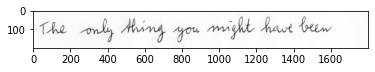

In [ ]:
# plt.imshow(plt.imread("/content/content/DeskewedLinesResized/047_42.png"), cmap = "gray")

In [ ]:
srcDirectory = "/content/content/DeskewedLinesResized"
destDirectory = "/content/ResizedLineSegWords"
totalFiles = len(os.listdir(srcDirectory))
count = 0
for file in os.listdir(srcDirectory):
        divideImageIntoHalf(file, srcDirectory, destDirectory)
        print("Remaining:", (totalFiles - count))
        count += 1

Remaining: 1781
Remaining: 1780
Remaining: 1779
Remaining: 1778
Remaining: 1777
Remaining: 1776
Remaining: 1775
Remaining: 1774
Remaining: 1773
Remaining: 1772
Remaining: 1771
Remaining: 1770
Remaining: 1769
Remaining: 1768
Remaining: 1767
Remaining: 1766
Remaining: 1765
Remaining: 1764
Remaining: 1763
Remaining: 1762
Remaining: 1761
Remaining: 1760
Remaining: 1759
Remaining: 1758
Remaining: 1757
Remaining: 1756
Remaining: 1755
Remaining: 1754
Remaining: 1753
Remaining: 1752
Remaining: 1751
Remaining: 1750
Remaining: 1749
Remaining: 1748
Remaining: 1747
Remaining: 1746
Remaining: 1745
Remaining: 1744
Remaining: 1743
Remaining: 1742
Remaining: 1741
Remaining: 1740
Remaining: 1739
Remaining: 1738
Remaining: 1737
Remaining: 1736
Remaining: 1735
Remaining: 1734
Remaining: 1733
Remaining: 1732
Remaining: 1731
Remaining: 1730
Remaining: 1729
Remaining: 1728
Remaining: 1727
Remaining: 1726
Remaining: 1725
Remaining: 1724
Remaining: 1723
Remaining: 1722
Remaining: 1721
Remaining: 1720
Remainin

In [ ]:
!zip -r resizedWordSegAugmented.zip /content/ResizedLineSegWords

Streaming output truncated to the last 5000 lines.
  adding: content/ResizedLineSegWords/003_14_5_SharpCntNeg.png (deflated 3%)
  adding: content/ResizedLineSegWords/046_12_2_OrgNeg.png (deflated 2%)
  adding: content/ResizedLineSegWords/003_21_7_OrgNeg.png (deflated 1%)
  adding: content/ResizedLineSegWords/047_47_5_SharpImgNeg.png (deflated 13%)
  adding: content/ResizedLineSegWords/007_10_2_SharpImg.png (deflated 11%)
  adding: content/ResizedLineSegWords/029_11_5_SharpCnt.png (deflated 9%)
  adding: content/ResizedLineSegWords/059_46_7_OrgNeg.png (deflated 2%)
  adding: content/ResizedLineSegWords/024_45_8_SharpImg.png (deflated 17%)
  adding: content/ResizedLineSegWords/011_14_0_SharpCntNeg.png (deflated 13%)
  adding: content/ResizedLineSegWords/023_41_0_OrgNeg.png (deflated 2%)
  adding: content/ResizedLineSegWords/014_17_2_OrgCntNeg.png (deflated 2%)
  adding: content/ResizedLineSegWords/035_42_7_SharpCntNeg.png (deflated 15%)
  adding: content/ResizedLineSegWords/012_32_5_Shar

In [ ]:
import shutil
shutil.copy('/content/resizedWordSegAugmented.zip', '/content/drive/MyDrive/HandWritingRecognition')

'/content/drive/MyDrive/HandWritingRecognition/resizedWordSegAugmented.zip'

Pixel Sum: 3176


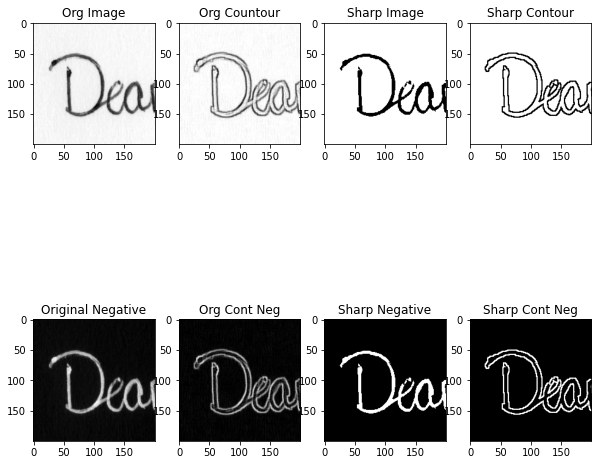

In [ ]:
srcDirectory = "/content/content/DeskewedLinesResized"
for file in os.listdir(srcDirectory):
        crpImg = divideImageIntoHalf("019_40.png", srcDirectory)
        break

# Test Data

## Deskew Images

In [ ]:
from skimage.io import imread
from skimage.io import imsave
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.util import invert
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from skimage.transform import rotate
import os
import shutil

In [ ]:
os.mkdir("04Files")

In [ ]:
len(os.listdir("/content/Test"))

110

In [ ]:
## Move train and test data in one folder
basePath = "/content/Test"
for file in os.listdir(basePath):
  # print(file)
  fileNumber = os.path.splitext(file)[0].split('_')[1]
  if fileNumber == '006' or fileNumber == '005':
    pass
  else:
    shutil.move(basePath + '/' + file, '/content/04Files')

In [ ]:
#find the horizontal projection of all the rows in the image
#rotate the image between angles -10 to 10 degrees and find the angle which gives the least median of horizontal projection
def horizontal_projections(sobel_image):
  sum_of_cols = []
  rows,cols = sobel_image.shape
  for row in range(rows-1):
    sum_of_cols.append(np.sum(sobel_image[row,:]))
    
  return sum_of_cols

In [ ]:
def deskewImages(fileName, srcFolder, destFolder):
    orgFilePath = os.path.join(srcFolder, fileName)
    orgImageFile = imread(orgFilePath)
    wrkImage = orgImageFile
    img = rgb2gray(wrkImage)
   
    # plt.imshow(img, cmap="gray")

    img = invert(sobel(img))
    # plt.imshow(sobel_image)

    rows,cols = img.shape
    predicted_angle = 0
    highest_hp = 0
    for index,angle in enumerate(range(-10,10)):
      hp = horizontal_projections(rotate(img, angle, cval=1))
      median_hp = np.median(hp)
      if highest_hp < median_hp:
        predicted_angle = angle
        highest_hp = median_hp
      
    # fig, ax = plt.subplots(ncols=2, figsize=(20,10))
    # ax[0].set_title('original image grayscale')
    # ax[0].imshow(img, cmap="gray")
    # ax[1].set_title('original image rotated by angle'+str(predicted_angle))
    # ax[1].imshow(rotate(orgImageFile, predicted_angle, cval=1))

  
    rotatedImage = rotate(orgImageFile, predicted_angle, cval=1)
    print(f'File Name:{fileName} Angle:{predicted_angle}')
    # # plt.imshow(rotatedImage)
    # print("original image")
    # plt.figure()

    # cv2_imshow(rotatedImage)
    if predicted_angle == 0:
      shutil.copy(orgFilePath, destFolder)
    elif abs(predicted_angle) > 3:
      filePath = os.path.join(destFolder, fileName)
      imsave(filePath, orgImageFile)
      # cv2.imwrite(filePath, orgImageFile)
    else:
      filePath = os.path.join(destFolder, fileName)
      imsave(filePath, rotatedImage)
      # cv2.imwrite(filePath, rotatedImage)

In [ ]:
!rm -rf /content/deskewedImages

In [ ]:
os.mkdir("deskewedTestImages")
destFolder = "/content/deskewedTestImages"
srcFolder = "/content/Test"

In [ ]:
totalFile = len(os.listdir('/content/Test'))
count = 0
for file in os.listdir(srcFolder):
    deskewImages(file, srcFolder, destFolder)
    count +=1 
    print("Remaining:", (totalFile - count))
    # break
    # if count == 3:
    #   break

File Name:001_005.png Angle:1
Remaining: 109
File Name:002_006.png Angle:0
Remaining: 108
File Name:060_006.png Angle:0
Remaining: 107
File Name:003_006.png Angle:0
Remaining: 106
File Name:008_005.png Angle:0
Remaining: 105
File Name:011_006.png Angle:0
Remaining: 104
File Name:027_006.png Angle:0
Remaining: 103


File Name:073_005.png Angle:1
Remaining: 102
File Name:018_006.png Angle:0
Remaining: 101
File Name:041_006.png Angle:0
Remaining: 100
File Name:031_006.png Angle:0
Remaining: 99
File Name:025_006.png Angle:0
Remaining: 98
File Name:058_005.png Angle:0
Remaining: 97
File Name:021_006.png Angle:0
Remaining: 96


File Name:014_005.png Angle:1
Remaining: 95
File Name:029_005.png Angle:0
Remaining: 94
File Name:002_005.png Angle:0
Remaining: 93
File Name:060_005.png Angle:0
Remaining: 92


File Name:023_005.png Angle:1
Remaining: 91
File Name:030_005.png Angle:0
Remaining: 90
File Name:019_005.png Angle:0
Remaining: 89
File Name:032_006.png Angle:0
Remaining: 88


File Name:049_006.png Angle:-1
Remaining: 87
File Name:013_005.png Angle:0
Remaining: 86


File Name:017_005.png Angle:2
Remaining: 85
File Name:071_005.png Angle:0
Remaining: 84
File Name:008_006.png Angle:0
Remaining: 83


File Name:036_006.png Angle:-1
Remaining: 82
File Name:028_005.png Angle:0
Remaining: 81


File Name:038_005.png Angle:1
Remaining: 80
File Name:036_005.png Angle:0
Remaining: 79
File Name:033_006.png Angle:0
Remaining: 78
File Name:039_005.png Angle:0
Remaining: 77
File Name:022_005.png Angle:0
Remaining: 76


File Name:057_006.png Angle:-1
Remaining: 75
File Name:037_005.png Angle:0
Remaining: 74
File Name:040_006.png Angle:0
Remaining: 73


File Name:073_006.png Angle:1
Remaining: 72
File Name:071_006.png Angle:0
Remaining: 71
File Name:042_006.png Angle:0
Remaining: 70


File Name:051_005.png Angle:1
Remaining: 69


File Name:003_005.png Angle:-1
Remaining: 68


File Name:020_005.png Angle:1
Remaining: 67


File Name:006_006.png Angle:-1
Remaining: 66
File Name:006_005.png Angle:0
Remaining: 65
File Name:012_005.png Angle:0
Remaining: 64


File Name:057_005.png Angle:-2
Remaining: 63


File Name:039_006.png Angle:1
Remaining: 62
File Name:023_006.png Angle:0
Remaining: 61
File Name:012_006.png Angle:0
Remaining: 60


File Name:035_005.png Angle:-2
Remaining: 59


File Name:017_006.png Angle:2
Remaining: 58


File Name:026_005.png Angle:1
Remaining: 57
File Name:069_006.png Angle:0
Remaining: 56


File Name:028_006.png Angle:1
Remaining: 55
File Name:014_006.png Angle:0
Remaining: 54
File Name:049_005.png Angle:0
Remaining: 53
File Name:059_006.png Angle:0
Remaining: 52
File Name:055_005.png Angle:0
Remaining: 51
File Name:050_006.png Angle:0
Remaining: 50
File Name:037_006.png Angle:0
Remaining: 49
File Name:070_006.png Angle:0
Remaining: 48


File Name:026_006.png Angle:1
Remaining: 47


File Name:035_006.png Angle:-1
Remaining: 46
File Name:048_006.png Angle:0
Remaining: 45
File Name:024_006.png Angle:0
Remaining: 44
File Name:019_006.png Angle:0
Remaining: 43
File Name:052_005.png Angle:0
Remaining: 42


File Name:022_006.png Angle:1
Remaining: 41
File Name:007_006.png Angle:0
Remaining: 40
File Name:024_005.png Angle:0
Remaining: 39
File Name:043_005.png Angle:0
Remaining: 38
File Name:011_005.png Angle:0
Remaining: 37
File Name:052_006.png Angle:0
Remaining: 36
File Name:042_005.png Angle:0
Remaining: 35
File Name:043_006.png Angle:0
Remaining: 34
File Name:059_005.png Angle:0
Remaining: 33


File Name:054_005.png Angle:1
Remaining: 32
File Name:051_006.png Angle:0
Remaining: 31


File Name:032_005.png Angle:-1
Remaining: 30
File Name:055_006.png Angle:0
Remaining: 29


File Name:054_006.png Angle:-1
Remaining: 28
File Name:034_005.png Angle:0
Remaining: 27
File Name:020_006.png Angle:0
Remaining: 26
File Name:007_005.png Angle:0
Remaining: 25


File Name:058_006.png Angle:1
Remaining: 24
File Name:041_005.png Angle:0
Remaining: 23


File Name:001_006.png Angle:-1
Remaining: 22


File Name:025_005.png Angle:1
Remaining: 21


File Name:047_005.png Angle:-1
Remaining: 20


File Name:034_006.png Angle:2
Remaining: 19
File Name:046_005.png Angle:0
Remaining: 18
File Name:031_005.png Angle:0
Remaining: 17


File Name:018_005.png Angle:-1
Remaining: 16


File Name:038_006.png Angle:1
Remaining: 15
File Name:033_005.png Angle:0
Remaining: 14
File Name:013_006.png Angle:0
Remaining: 13
File Name:040_005.png Angle:0
Remaining: 12


File Name:048_005.png Angle:-1
Remaining: 11
File Name:070_005.png Angle:0
Remaining: 10
File Name:050_005.png Angle:0
Remaining: 9
File Name:056_006.png Angle:0
Remaining: 8
File Name:027_005.png Angle:0
Remaining: 7
File Name:069_005.png Angle:0
Remaining: 6


File Name:047_006.png Angle:-1
Remaining: 5


File Name:021_005.png Angle:1
Remaining: 4
File Name:029_006.png Angle:0
Remaining: 3


File Name:030_006.png Angle:1
Remaining: 2
File Name:056_005.png Angle:-4
Remaining: 1
File Name:046_006.png Angle:0
Remaining: 0


In [ ]:
!zip -r DeskewedTestImages.zip /content/deskewedTestImages

  adding: content/deskewedTestImages/ (stored 0%)
  adding: content/deskewedTestImages/001_005.png (deflated 0%)
  adding: content/deskewedTestImages/002_006.png (deflated 0%)
  adding: content/deskewedTestImages/060_006.png (deflated 0%)
  adding: content/deskewedTestImages/003_006.png (deflated 0%)
  adding: content/deskewedTestImages/008_005.png (deflated 0%)
  adding: content/deskewedTestImages/011_006.png (deflated 0%)
  adding: content/deskewedTestImages/027_006.png (deflated 0%)
  adding: content/deskewedTestImages/073_005.png (deflated 0%)
  adding: content/deskewedTestImages/018_006.png (deflated 0%)
  adding: content/deskewedTestImages/041_006.png (deflated 0%)
  adding: content/deskewedTestImages/031_006.png (deflated 0%)
  adding: content/deskewedTestImages/025_006.png (deflated 0%)
  adding: content/deskewedTestImages/058_005.png (deflated 0%)
  adding: content/deskewedTestImages/021_006.png (deflated 0%)
  adding: content/deskewedTestImages/014_005.png (deflated 0%)
  add

In [ ]:
shutil.copy('/content/DeskewedTestImages.zip', '/content/drive/MyDrive/handWritingTestWords')

'/content/drive/MyDrive/handWritingTestWords/DeskewedTestImages.zip'

## Extract Lines

In [ ]:
# from zipfile import ZipFile

In [ ]:
# from zipfile import ZipFile
# ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/OfflineHWtext (1).zip", "r")
# ref.extractall()
# ref.close()

In [ ]:
# ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedImages.zip", "r")
# ref.extractall()
# ref.close()

In [ ]:
!pip install findpeaks

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 44 kB 1.5 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=412d012b44b6d67b68531dded57c5f9ca92b4c2f87bd435089731307af8ab6d8
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [ ]:
# Import Required Libraries
import os
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
from skimage.filters import sobel
import numpy as np
from scipy.signal import savgol_filter
from findpeaks import findpeaks

In [ ]:
def getLines(file, srcDirectory, destDirectory, resizedDirectory):
  filePath = os.path.join(srcDirectory, file)
  imgOrg = cv2.imread(filePath)
  # Convert Image into Gray
  gray = cv2.cvtColor(imgOrg,cv2.COLOR_BGR2GRAY)
  # Apply Sobel filter to image
  sobel_image = sobel(gray)
  # Get horizontal projections from Image
  hpp = np.sum(sobel_image, axis=1)  
  # Smooth HPP to get valley and peaks in graph
  yhat = savgol_filter(hpp, 31, 1) # window size 51, polynomial order 3
  yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
  yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
  yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
  yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
  # Get peaks and valleys from graph 
  # Initialize findpeak
  fp = findpeaks(lookahead=1)
  results = fp.fit(yhat)
  # Get Valleys from results to be used to divide image into lines
  breakPoints = []
  for val, index in zip(results['df']['valley'], range(len(results['df']['valley']))):
    # print(val)
    if val:
      breakPoints.append(index)
  # Split Image into lines
  fileNumber = os.path.splitext(file)[0].split('_')[0] # Get file number form file name
  count = 0
  innerCount = os.path.splitext(file)[0].split('_')[1][-1]
  for i in range(len(breakPoints)-1):
    imgCrop = gray[breakPoints[i]:breakPoints[i+1]]
    if imgCrop.shape[0] > 50:
      cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(innerCount) + str(count) + '.png', imgCrop) # Save gray image patch into current folder
      imgResize = cv2.resize(imgCrop, (1800, 200), interpolation=cv2.INTER_AREA)
      cv2.imwrite(resizedDirectory + '/' + fileNumber + "_" + str(innerCount) + str(count) + '.png', imgResize) # Save gray image patch into current folder
      count += 1    


In [ ]:
!rm -rf /content/DeskewedLinesOriginal
!rm -rf /content/DeskewedLinesResized

In [ ]:
os.mkdir("DeskewedTestLinesOriginal")
os.mkdir("DeskewedTestLinesResized")

In [ ]:
srcDir = "/content/deskewedTestImages" # Source Directory
desDir = "/content/DeskewedTestLinesOriginal"  # Destination Directory
resizedDirectory = "/content/DeskewedTestLinesResized"
count = 0
totalFiles = len(os.listdir(srcDir))
for file in os.listdir(srcDir):
  getLines(file, srcDir, desDir, resizedDirectory)
  print("Remaining Files:", (totalFiles - count))
  count += 1

[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 110
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 109
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 108
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 107
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 106
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 105
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 104
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 103
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 102
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 101
[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..
Remaining Files: 100
[findpeaks] >Finding 

In [ ]:
!zip -r DeskewedTestLineImagesOriginal.zip /content/DeskewedTestLinesOriginal
!zip -r DeskewedTestLineImagesResized.zip /content/DeskewedTestLinesResized

  adding: content/DeskewedTestLinesOriginal/ (stored 0%)
  adding: content/DeskewedTestLinesOriginal/032_53.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/035_54.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/049_62.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/006_61.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/032_60.png (deflated 2%)
  adding: content/DeskewedTestLinesOriginal/021_61.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/017_54.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/021_50.png (deflated 2%)
  adding: content/DeskewedTestLinesOriginal/038_56.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/046_54.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/012_64.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/038_61.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/030_56.png (deflated 1%)
  adding: content/DeskewedTestLinesOriginal/03

In [ ]:
import shutil

In [ ]:
# Copy the data into google Drive
shutil.copy('/content/DeskewedTestLineImagesOriginal.zip', '/content/drive/MyDrive/handWritingTestWords')
shutil.copy('/content/DeskewedTestLineImagesResized.zip', '/content/drive/MyDrive/handWritingTestWords')

'/content/drive/MyDrive/handWritingTestWords/DeskewedTestLineImagesResized.zip'

# Divide images into Segments

In [ ]:
# from zipfile import ZipFile
# ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedLineImagesResized.zip", "r")
# ref.extractall()
# ref.close()

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import shutil
from skimage.filters import sobel
from google.colab.patches import cv2_imshow

## Normal Segmentation

In [ ]:
def divideImageIntoHalf(file, srcDirectory, destDirectory=None):
    filePath = os.path.join(srcDirectory, file)
    orgImage = plt.imread(filePath)
    for i in range(9):
        cropImage = orgImage[:, 200 * i: 200 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1000:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            fileName = destDirectory + '/' + fileNumber + "_" + str(i) + '.png'
            plt.imsave(fileName, cropImage, cmap = "gray")

In [ ]:
os.mkdir("resizedTestWordSegNormal")

In [ ]:
srcDirectory = "/content/DeskewedTestLinesResized"
destDirectory = "/content/resizedTestWordSegNormal"
totalFiles = len(os.listdir(srcDirectory))
count = 0
for file in os.listdir(srcDirectory):
        divideImageIntoHalf(file, srcDirectory, destDirectory)
        print("Remaining:", (totalFiles - count))
        count += 1

Remaining: 547
Remaining: 546
Remaining: 545
Remaining: 544
Remaining: 543
Remaining: 542
Remaining: 541
Remaining: 540
Remaining: 539
Remaining: 538
Remaining: 537
Remaining: 536
Remaining: 535
Remaining: 534
Remaining: 533
Remaining: 532
Remaining: 531
Remaining: 530
Remaining: 529
Remaining: 528
Remaining: 527
Remaining: 526
Remaining: 525
Remaining: 524
Remaining: 523
Remaining: 522
Remaining: 521
Remaining: 520
Remaining: 519
Remaining: 518
Remaining: 517
Remaining: 516
Remaining: 515
Remaining: 514
Remaining: 513
Remaining: 512
Remaining: 511
Remaining: 510
Remaining: 509
Remaining: 508
Remaining: 507
Remaining: 506
Remaining: 505
Remaining: 504
Remaining: 503
Remaining: 502
Remaining: 501
Remaining: 500
Remaining: 499
Remaining: 498
Remaining: 497
Remaining: 496
Remaining: 495
Remaining: 494
Remaining: 493
Remaining: 492
Remaining: 491
Remaining: 490
Remaining: 489
Remaining: 488
Remaining: 487
Remaining: 486
Remaining: 485
Remaining: 484
Remaining: 483
Remaining: 482
Remaining:

In [ ]:
!zip -r resizedTestWordSegNormal.zip /content/resizedTestWordSegNormal

updating: content/resizedTestWordSegNormal/ (stored 0%)
updating: content/resizedTestWordSegNormal/006_51_6.png (deflated 2%)
updating: content/resizedTestWordSegNormal/024_50_0.png (deflated 2%)
updating: content/resizedTestWordSegNormal/020_64_0.png (deflated 1%)
updating: content/resizedTestWordSegNormal/006_50_6.png (deflated 2%)
updating: content/resizedTestWordSegNormal/050_62_0.png (deflated 1%)
updating: content/resizedTestWordSegNormal/027_62_6.png (deflated 1%)
updating: content/resizedTestWordSegNormal/008_63_3.png (deflated 1%)
updating: content/resizedTestWordSegNormal/046_50_6.png (deflated 2%)
updating: content/resizedTestWordSegNormal/011_53_2.png (deflated 2%)
updating: content/resizedTestWordSegNormal/047_52_4.png (deflated 2%)
updating: content/resizedTestWordSegNormal/020_51_3.png (deflated 2%)
updating: content/resizedTestWordSegNormal/039_53_3.png (deflated 2%)
updating: content/resizedTestWordSegNormal/020_65_1.png (deflated 1%)
updating: content/resizedTestWordS

In [ ]:
shutil.copy('/content/resizedTestWordSegNormal.zip', '/content/drive/MyDrive/handWritingTestWords')

'/content/drive/MyDrive/handWritingTestWords/resizedTestWordSegNormal.zip'

## Augmented Segmentation

In [ ]:
def divideImageIntoHalf(file, srcDirectory, destDirectory=None):
    filePath = os.path.join(srcDirectory, file)
    orgImage = plt.imread(filePath)
    for i in range(9):
        cropImage = orgImage[:, 200 * i: 200 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1500:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            orgImgNeg = 1.0 - cropImage # Negative of original Image
            # Get Eroded Image
            # Taking a matrix of size 5 as the kernel
            kernel = np.ones((5,5), np.uint8)
            img_erosion = cv2.erode(cropImage, kernel, iterations=1)
            # Subtract eroded image from original image
            contImg = img_erosion - cropImage # Subtract eroded image from original Image
            contImgNeg = 1.0 - contImg    # Negative of contour Image

            # Sharp Image
            threshImageSharp = np.where(cropImage > 0.7, 0.9, 0)
            img_erosionSharp = cv2.erode(threshImageSharp, kernel, iterations=1)
            subSharp = img_erosionSharp - threshImageSharp
            threshImageSharpNeg = 1.0 - threshImageSharp
            subSharpNeg = 1.0 - subSharp
            
            # Store Images into list
            imagesList = [cropImage, contImg, threshImageSharp, subSharp, orgImgNeg, contImgNeg, threshImageSharpNeg, subSharpNeg]
            titleList = ["OrgImage", "OrgCnt", "SharpImg", "SharpCnt", "OrgNeg", "OrgCntNeg", "SharpImgNeg", "SharpCntNeg"]
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            # cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[i] + '.png', imagesList[i]) # Save gray image patch into current folder
            for j in range(len(imagesList)):
              fileName = destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[j] + '.png'
              plt.imsave(fileName, imagesList[j], cmap = "gray")
            # cv2_imshow(imagesList[i])
            # plt.imshow(imagesList[i], cmap = "gray")
            # Plot the images
            # fig,a =  plt.subplots(2,4,figsize=(10,10))
            
            # for i in range(len(imagesList)):
            #     if i < 4:
            #         a[0][i].imshow(imagesList[i], cmap = "gray")
            #         a[0][i].set_title(titleList[i])
            #     else:
            #         j = i - 4
            #         a[1][j].imshow(imagesList[i], cmap = "gray")
            #         a[1][j].set_title(titleList[i])
            # return cropImage
        # break

In [ ]:
!rm -rf /content/resizedTestWordSegAugmented

In [ ]:
os.mkdir("resizedTestWordSegAugmented")

In [ ]:
srcDirectory = "/content/DeskewedTestLinesResized"
destDirectory = "/content/resizedTestWordSegAugmented"
totalFiles = len(os.listdir(srcDirectory))
count = 0
for file in os.listdir(srcDirectory):
        divideImageIntoHalf(file, srcDirectory, destDirectory)
        print("Remaining:", (totalFiles - count))
        count += 1

Remaining: 547
Remaining: 546
Remaining: 545
Remaining: 544
Remaining: 543
Remaining: 542
Remaining: 541
Remaining: 540
Remaining: 539
Remaining: 538
Remaining: 537
Remaining: 536
Remaining: 535
Remaining: 534
Remaining: 533
Remaining: 532
Remaining: 531
Remaining: 530
Remaining: 529
Remaining: 528
Remaining: 527
Remaining: 526
Remaining: 525
Remaining: 524
Remaining: 523
Remaining: 522
Remaining: 521
Remaining: 520
Remaining: 519
Remaining: 518
Remaining: 517
Remaining: 516
Remaining: 515
Remaining: 514
Remaining: 513
Remaining: 512
Remaining: 511
Remaining: 510
Remaining: 509
Remaining: 508
Remaining: 507
Remaining: 506
Remaining: 505
Remaining: 504
Remaining: 503
Remaining: 502
Remaining: 501
Remaining: 500
Remaining: 499
Remaining: 498
Remaining: 497
Remaining: 496
Remaining: 495
Remaining: 494
Remaining: 493
Remaining: 492
Remaining: 491
Remaining: 490
Remaining: 489
Remaining: 488
Remaining: 487
Remaining: 486
Remaining: 485
Remaining: 484
Remaining: 483
Remaining: 482
Remaining:

Remaining: 547


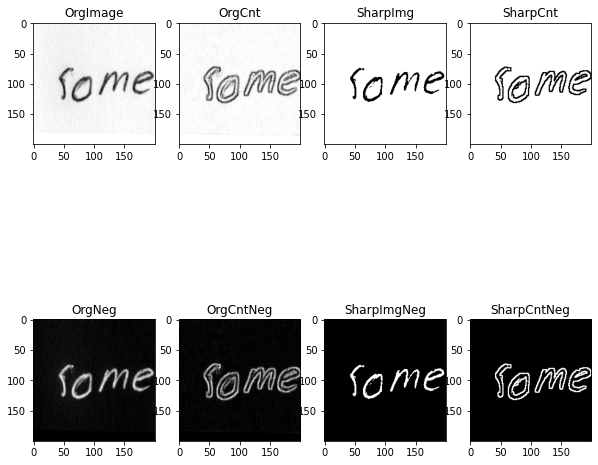

In [ ]:
srcDirectory = "/content/DeskewedTestLinesResized"
destDirectory = "/content/resizedTestWordSegAugmented"
totalFiles = len(os.listdir(srcDirectory))
count = 0
for file in os.listdir(srcDirectory):
        crpImg = divideImageIntoHalf(file, srcDirectory, destDirectory)
        print("Remaining:", (totalFiles - count))
        break
        count += 1

In [ ]:
!zip -r resizedTestWordSegAugmented.zip /content/resizedTestWordSegAugmented

Streaming output truncated to the last 5000 lines.
  adding: content/resizedTestWordSegAugmented/056_54_2_SharpCntNeg.png (deflated 6%)
  adding: content/resizedTestWordSegAugmented/006_53_3_SharpCntNeg.png (deflated 7%)
  adding: content/resizedTestWordSegAugmented/043_61_8_SharpImg.png (deflated 16%)
  adding: content/resizedTestWordSegAugmented/054_60_3_SharpImg.png (deflated 16%)
  adding: content/resizedTestWordSegAugmented/008_50_2_OrgCnt.png (deflated 3%)
  adding: content/resizedTestWordSegAugmented/046_63_3_OrgCntNeg.png (deflated 2%)
  adding: content/resizedTestWordSegAugmented/011_52_4_OrgNeg.png (deflated 2%)
  adding: content/resizedTestWordSegAugmented/059_63_4_OrgCnt.png (deflated 2%)
  adding: content/resizedTestWordSegAugmented/060_61_8_OrgCntNeg.png (deflated 2%)
  adding: content/resizedTestWordSegAugmented/013_61_8_SharpImg.png (deflated 13%)
  adding: content/resizedTestWordSegAugmented/034_63_5_OrgCntNeg.png (deflated 2%)
  adding: content/resizedTestWordSegAugme

In [ ]:
import shutil
shutil.copy('/content/resizedTestWordSegAugmented.zip', '/content/drive/MyDrive/handWritingTestWords')

'/content/drive/MyDrive/handWritingTestWords/resizedTestWordSegAugmented.zip'

In [ ]:
os.mkdir("/content/drive/MyDrive/handWritingTestWords")

Pixel Sum: 3176


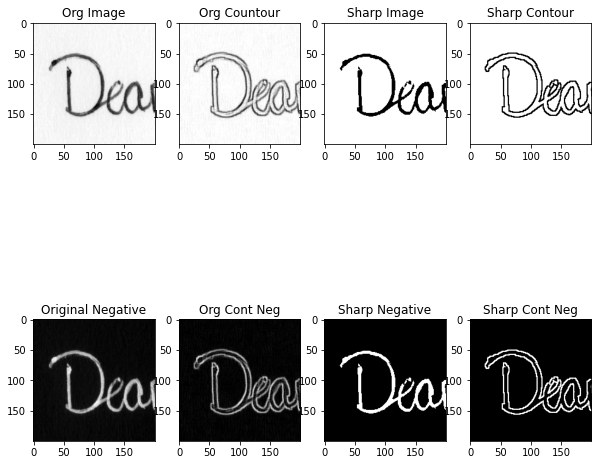

In [ ]:
srcDirectory = "/content/content/DeskewedLinesResized"
for file in os.listdir(srcDirectory):
        crpImg = divideImageIntoHalf("019_40.png", srcDirectory)
        break

# Processing I'AM Dataset


In [ ]:
from zipfile import ZipFile
ref = ZipFile('/content/drive/MyDrive/IAM_Dataset/LinesData.zip', 'r')
ref.extractall()
ref.close()

## Normal Segmentation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.io import imsave
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.util import invert
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from skimage.transform import rotate
import os
import shutil

In [ ]:
img = plt.imread('/content/TrainingData/1/a01-000x-00.png')
img.shape

(200, 1600)

### Processing Training Data

In [ ]:
def divideImageIntoHalf(file, srcDirectory, destDirectory=None):
    filePath = os.path.join(srcDirectory, file)
    orgImage = plt.imread(filePath)
    for i in range(int(orgImage.shape[1])):
        cropImage = orgImage[:, 200 * i: 200 * (i+1)] # Crop the original image into parts
        # threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(cropImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1000:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            fileName = destDirectory + '/' + fileNumber + "_" + str(i) + '.png'
            plt.imsave(fileName, cropImage, cmap = "gray")

In [ ]:
os.mkdir("resizedTrainWordSegNormal")

In [ ]:
srcDirectory = "/content/TrainingData"
destDirectory = "/content/resizedTrainWordSegNormal"
os.mkdir("resizedTrainWordSegNormal")
totalFiles = len(os.listdir(srcDirectory))
count = 0
for subFolder in os.listdir(srcDirectory):
    subPath = os.path.join(srcDirectory, subFolder)
    try:
      os.mkdir(destDirectory+'/'+subFolder)
      destDirectorySub = os.path.join(destDirectory, subFolder)
    except FileExistsError:
      pass
    for file in os.listdir(subPath):
      divideImageIntoHalf(file, subPath, destDirectorySub)
    print("Remaining:", (totalFiles - count))
    count += 1

Remaining: 656
Remaining: 655
Remaining: 654
Remaining: 653
Remaining: 652
Remaining: 651
Remaining: 650
Remaining: 649
Remaining: 648
Remaining: 647
Remaining: 646
Remaining: 645
Remaining: 644
Remaining: 643
Remaining: 642
Remaining: 641
Remaining: 640
Remaining: 639
Remaining: 638
Remaining: 637
Remaining: 636
Remaining: 635
Remaining: 634
Remaining: 633
Remaining: 632
Remaining: 631
Remaining: 630
Remaining: 629
Remaining: 628
Remaining: 627
Remaining: 626
Remaining: 625
Remaining: 624
Remaining: 623
Remaining: 622
Remaining: 621
Remaining: 620
Remaining: 619
Remaining: 618
Remaining: 617
Remaining: 616
Remaining: 615
Remaining: 614
Remaining: 613
Remaining: 612
Remaining: 611
Remaining: 610
Remaining: 609
Remaining: 608
Remaining: 607
Remaining: 606
Remaining: 605
Remaining: 604
Remaining: 603
Remaining: 602
Remaining: 601
Remaining: 600
Remaining: 599
Remaining: 598
Remaining: 597
Remaining: 596
Remaining: 595
Remaining: 594
Remaining: 593
Remaining: 592
Remaining: 591
Remaining:

In [ ]:
# !rm -rf /content/resizedTrainWordSegNormal

In [ ]:
!zip -r resizedIAMTrainWordSegNormal.zip /content/resizedTrainWordSegNormal

Streaming output truncated to the last 5000 lines.
  adding: content/resizedTrainWordSegNormal/172/c04-165-01_7.png (deflated 10%)
  adding: content/resizedTrainWordSegNormal/172/c04-165-03_5.png (deflated 10%)
  adding: content/resizedTrainWordSegNormal/172/c04-170-04_5.png (deflated 7%)
  adding: content/resizedTrainWordSegNormal/172/c04-170-04_4.png (deflated 9%)
  adding: content/resizedTrainWordSegNormal/172/c04-165-02_0.png (deflated 9%)
  adding: content/resizedTrainWordSegNormal/172/c04-165-01_5.png (deflated 10%)
  adding: content/resizedTrainWordSegNormal/172/c04-165-08_3.png (deflated 10%)
  adding: content/resizedTrainWordSegNormal/172/c04-165-05_2.png (deflated 9%)
  adding: content/resizedTrainWordSegNormal/172/c04-170-01_6.png (deflated 8%)
  adding: content/resizedTrainWordSegNormal/172/c04-170-02_2.png (deflated 10%)
  adding: content/resizedTrainWordSegNormal/172/c04-165-03_0.png (deflated 11%)
  adding: content/resizedTrainWordSegNormal/172/c04-170-03_3.png (deflated

In [ ]:
shutil.copy('/content/resizedIAMTrainWordSegNormal.zip', '/content/drive/MyDrive/IAM_Dataset')

'/content/drive/MyDrive/IAM_Dataset/resizedIAMTrainWordSegNormal.zip'

## Processing Test Data

In [ ]:
srcDirectory = "/content/TestData"
destDirectory = "/content/resizedTestWordSegNormal"
os.mkdir("resizedTestWordSegNormal")
totalFiles = len(os.listdir(srcDirectory))
count = 0
for subFolder in os.listdir(srcDirectory):
    subPath = os.path.join(srcDirectory, subFolder)
    try:
      os.mkdir(destDirectory+'/'+subFolder)
      destDirectorySub = os.path.join(destDirectory, subFolder)
    except FileExistsError:
      pass
    for file in os.listdir(subPath):
      divideImageIntoHalf(file, subPath, destDirectorySub)
    print("Remaining:", (totalFiles - count))
    count += 1

Remaining: 656
Remaining: 655
Remaining: 654
Remaining: 653
Remaining: 652
Remaining: 651
Remaining: 650
Remaining: 649
Remaining: 648
Remaining: 647
Remaining: 646
Remaining: 645
Remaining: 644
Remaining: 643
Remaining: 642
Remaining: 641
Remaining: 640
Remaining: 639
Remaining: 638
Remaining: 637
Remaining: 636
Remaining: 635
Remaining: 634
Remaining: 633
Remaining: 632
Remaining: 631
Remaining: 630
Remaining: 629
Remaining: 628
Remaining: 627
Remaining: 626
Remaining: 625
Remaining: 624
Remaining: 623
Remaining: 622
Remaining: 621
Remaining: 620
Remaining: 619
Remaining: 618
Remaining: 617
Remaining: 616
Remaining: 615
Remaining: 614
Remaining: 613
Remaining: 612
Remaining: 611
Remaining: 610
Remaining: 609
Remaining: 608
Remaining: 607
Remaining: 606
Remaining: 605
Remaining: 604
Remaining: 603
Remaining: 602
Remaining: 601
Remaining: 600
Remaining: 599
Remaining: 598
Remaining: 597
Remaining: 596
Remaining: 595
Remaining: 594
Remaining: 593
Remaining: 592
Remaining: 591
Remaining:

In [ ]:
!zip -r resizedIAMTestWordSegNormal.zip /content/resizedTestWordSegNormal

Streaming output truncated to the last 5000 lines.
  adding: content/resizedTestWordSegNormal/563/n02-045-03_4.png (deflated 6%)
  adding: content/resizedTestWordSegNormal/563/n02-040-04_0.png (deflated 8%)
  adding: content/resizedTestWordSegNormal/563/n02-040-00_6.png (deflated 7%)
  adding: content/resizedTestWordSegNormal/563/n02-040-04_7.png (deflated 4%)
  adding: content/resizedTestWordSegNormal/563/n02-045-03_2.png (deflated 8%)
  adding: content/resizedTestWordSegNormal/563/n02-040-04_6.png (deflated 7%)
  adding: content/resizedTestWordSegNormal/563/n02-045-03_7.png (deflated 6%)
  adding: content/resizedTestWordSegNormal/563/n02-045-03_3.png (deflated 6%)
  adding: content/resizedTestWordSegNormal/563/n02-045-03_0.png (deflated 8%)
  adding: content/resizedTestWordSegNormal/563/n02-045-03_8.png (deflated 8%)
  adding: content/resizedTestWordSegNormal/563/n02-040-04_4.png (deflated 6%)
  adding: content/resizedTestWordSegNormal/563/n02-040-04_5.png (deflated 6%)
  adding: con

In [ ]:
shutil.copy('/content/resizedIAMTestWordSegNormal.zip', '/content/drive/MyDrive/IAM_Dataset')

'/content/drive/MyDrive/IAM_Dataset/resizedIAMTestWordSegNormal.zip'

## Augmented Segmentation

In [ ]:
!rm -rf /content/resizedTrainWordSegAugmented

In [ ]:
def divideImageIntoHalfAugmented(file, srcDirectory, destDirectory=None):
    filePath = os.path.join(srcDirectory, file)
    orgImage = plt.imread(filePath)
    for i in range(int(orgImage.shape[1])):
        cropImage = orgImage[:, 200 * i: 200 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1500:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            orgImgNeg = 1.0 - cropImage # Negative of original Image
            # Get Eroded Image
            # Taking a matrix of size 5 as the kernel
            kernel = np.ones((5,5), np.uint8)
            img_erosion = cv2.erode(cropImage, kernel, iterations=1)
            # Subtract eroded image from original image
            contImg = img_erosion - cropImage # Subtract eroded image from original Image
            contImgNeg = 1.0 - contImg    # Negative of contour Image

            # Sharp Image
            threshImageSharp = np.where(cropImage > 0.7, 0.9, 0)
            img_erosionSharp = cv2.erode(threshImageSharp, kernel, iterations=1)
            subSharp = img_erosionSharp - threshImageSharp
            threshImageSharpNeg = 1.0 - threshImageSharp
            subSharpNeg = 1.0 - subSharp
            
            # Store Images into list
            imagesList = [cropImage, contImg, threshImageSharp, subSharp, orgImgNeg, contImgNeg, threshImageSharpNeg, subSharpNeg]
            titleList = ["OrgImage", "OrgCnt", "SharpImg", "SharpCnt", "OrgNeg", "OrgCntNeg", "SharpImgNeg", "SharpCntNeg"]
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            # cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[i] + '.png', imagesList[i]) # Save gray image patch into current folder
            for j in range(len(imagesList)):
              fileName = destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[j] + '.png'
              plt.imsave(fileName, imagesList[j], cmap = "gray")
            # cv2_imshow(imagesList[i])
            # plt.imshow(imagesList[i], cmap = "gray")
            # Plot the images
            # fig,a =  plt.subplots(2,4,figsize=(10,10))
            
            # for i in range(len(imagesList)):
            #     if i < 4:
            #         a[0][i].imshow(imagesList[i], cmap = "gray")
            #         a[0][i].set_title(titleList[i])
            #     else:
            #         j = i - 4
            #         a[1][j].imshow(imagesList[i], cmap = "gray")
            #         a[1][j].set_title(titleList[i])
            # return cropImage
        # break

In [ ]:
srcDirectory = "/content/TrainingData"
destDirectory = "/content/resizedTrainWordSegAugmented"
os.mkdir("resizedTrainWordSegAugmented")
totalFiles = len(os.listdir(srcDirectory))
count = 0
for subFolder in os.listdir(srcDirectory):
    subPath = os.path.join(srcDirectory, subFolder)
    try:
      os.mkdir(destDirectory+'/'+subFolder)
      destDirectorySub = os.path.join(destDirectory, subFolder)
    except FileExistsError:
      pass
    for file in os.listdir(subPath):
      divideImageIntoHalfAugmented(file, subPath, destDirectorySub)
    print("Remaining:", (totalFiles - count))
    count += 1

Remaining: 656
Remaining: 655
Remaining: 654
Remaining: 653
Remaining: 652
Remaining: 651
Remaining: 650
Remaining: 649
Remaining: 648
Remaining: 647
Remaining: 646
Remaining: 645
Remaining: 644
Remaining: 643
Remaining: 642
Remaining: 641
Remaining: 640
Remaining: 639
Remaining: 638
Remaining: 637
Remaining: 636
Remaining: 635
Remaining: 634
Remaining: 633
Remaining: 632
Remaining: 631
Remaining: 630
Remaining: 629
Remaining: 628
Remaining: 627
Remaining: 626
Remaining: 625
Remaining: 624
Remaining: 623
Remaining: 622
Remaining: 621
Remaining: 620
Remaining: 619
Remaining: 618
Remaining: 617
Remaining: 616
Remaining: 615
Remaining: 614
Remaining: 613
Remaining: 612
Remaining: 611
Remaining: 610
Remaining: 609
Remaining: 608
Remaining: 607
Remaining: 606
Remaining: 605
Remaining: 604
Remaining: 603
Remaining: 602
Remaining: 601
Remaining: 600
Remaining: 599
Remaining: 598
Remaining: 597
Remaining: 596
Remaining: 595
Remaining: 594
Remaining: 593
Remaining: 592
Remaining: 591
Remaining:

In [ ]:
!zip -r resizedIAMTrainWordSegAugmented.zip /content/resizedTrainWordSegAugmented
shutil.copy('/content/resizedIAMTrainWordSegAugmented.zip', '/content/drive/MyDrive/IAM_Dataset')

Streaming output truncated to the last 5000 lines.
  adding: content/resizedTrainWordSegAugmented/129/b06-027-07_0_SharpCntNeg.png (deflated 8%)
  adding: content/resizedTrainWordSegAugmented/129/b06-027-02_7_OrgCntNeg.png (deflated 7%)
  adding: content/resizedTrainWordSegAugmented/129/c06-014-09_7_OrgCnt.png (deflated 4%)
  adding: content/resizedTrainWordSegAugmented/129/c06-138-00_8_OrgNeg.png (deflated 5%)
  adding: content/resizedTrainWordSegAugmented/129/c06-014-08_1_OrgNeg.png (deflated 3%)
  adding: content/resizedTrainWordSegAugmented/129/b06-027-03_8_SharpImgNeg.png (deflated 7%)
  adding: content/resizedTrainWordSegAugmented/129/b06-027-07_2_OrgImage.png (deflated 4%)
  adding: content/resizedTrainWordSegAugmented/129/b06-027-04_3_SharpImgNeg.png (deflated 9%)
  adding: content/resizedTrainWordSegAugmented/129/c06-103-05_1_OrgImage.png (deflated 3%)
  adding: content/resizedTrainWordSegAugmented/129/c06-014-01_8_OrgCntNeg.png (deflated 5%)
  adding: content/resizedTrainWord

'/content/drive/MyDrive/IAM_Dataset/resizedIAMTrainWordSegAugmented.zip'

In [ ]:
print("!!DONE!!")

!!DONE!!


### Processing Test Data

In [ ]:
srcDirectory = "/content/TestData"
destDirectory = "/content/resizedTestWordSegAugmented"
os.mkdir("resizedTestWordSegAugmented")
totalFiles = len(os.listdir(srcDirectory))
count = 0
for subFolder in os.listdir(srcDirectory):
    subPath = os.path.join(srcDirectory, subFolder)
    try:
      os.mkdir(destDirectory+'/'+subFolder)
      destDirectorySub = os.path.join(destDirectory, subFolder)
    except FileExistsError:
      pass
    for file in os.listdir(subPath):
      divideImageIntoHalfAugmented(file, subPath, destDirectorySub)
    print("Remaining:", (totalFiles - count))
    count += 1

Remaining: 656
Remaining: 655
Remaining: 654
Remaining: 653
Remaining: 652
Remaining: 651
Remaining: 650
Remaining: 649
Remaining: 648
Remaining: 647
Remaining: 646
Remaining: 645
Remaining: 644
Remaining: 643
Remaining: 642
Remaining: 641
Remaining: 640
Remaining: 639
Remaining: 638
Remaining: 637
Remaining: 636
Remaining: 635
Remaining: 634
Remaining: 633
Remaining: 632
Remaining: 631
Remaining: 630
Remaining: 629
Remaining: 628
Remaining: 627
Remaining: 626
Remaining: 625
Remaining: 624
Remaining: 623
Remaining: 622
Remaining: 621
Remaining: 620
Remaining: 619
Remaining: 618
Remaining: 617
Remaining: 616
Remaining: 615
Remaining: 614
Remaining: 613
Remaining: 612
Remaining: 611
Remaining: 610
Remaining: 609
Remaining: 608
Remaining: 607
Remaining: 606
Remaining: 605
Remaining: 604
Remaining: 603
Remaining: 602
Remaining: 601
Remaining: 600
Remaining: 599
Remaining: 598
Remaining: 597
Remaining: 596
Remaining: 595
Remaining: 594
Remaining: 593
Remaining: 592
Remaining: 591
Remaining:

In [ ]:
!zip -r resizedIAMTestWordSegAugmented.zip /content/resizedTestWordSegAugmented
shutil.copy('/content/resizedIAMTestWordSegAugmented.zip', '/content/drive/MyDrive/IAM_Dataset')

Streaming output truncated to the last 5000 lines.
  adding: content/resizedTestWordSegAugmented/548/m04-180-02_5_SharpCntNeg.png (deflated 10%)
  adding: content/resizedTestWordSegAugmented/548/m04-180-02_5_SharpCnt.png (deflated 11%)
  adding: content/resizedTestWordSegAugmented/548/m04-145-00_2_SharpCntNeg.png (deflated 8%)
  adding: content/resizedTestWordSegAugmented/548/m04-152-00_2_SharpImg.png (deflated 10%)
  adding: content/resizedTestWordSegAugmented/548/m04-152-00_6_SharpCntNeg.png (deflated 9%)
  adding: content/resizedTestWordSegAugmented/548/m04-145-00_0_OrgNeg.png (deflated 8%)
  adding: content/resizedTestWordSegAugmented/548/m04-152-00_6_OrgNeg.png (deflated 9%)
  adding: content/resizedTestWordSegAugmented/548/m04-145-04_8_OrgCntNeg.png (deflated 8%)
  adding: content/resizedTestWordSegAugmented/548/m04-152-00_6_SharpCnt.png (deflated 9%)
  adding: content/resizedTestWordSegAugmented/548/m04-145-00_0_OrgImage.png (deflated 8%)
  adding: content/resizedTestWordSegAugm

'/content/drive/MyDrive/IAM_Dataset/resizedIAMTestWordSegAugmented.zip'

In [ ]:
print("@@@Done@@@")

@@@Done@@@


## Adding Extra pixels to make lines size multiple of 200
26 September 2022


In [ ]:
from zipfile import ZipFile
import os
from tqdm import tqdm
import shutil
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

In [ ]:
ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedImages.zip", "r")
ref.extractall()
ref.close()

In [ ]:
ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedLineImagesOriginal.zip", "r")
ref.extractall()
ref.close()

In [ ]:
workingDirectory = "/content/content/DeskewedLinesOriginal"

In [ ]:
# os.mkdir(os.path.join(os.getcwd(), 'newLinesData'))
newFolderPath = os.path.join(os.getcwd(), 'newLinesData')

(211, 2457)


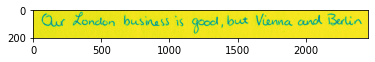

In [ ]:
img = plt.imread('/content/content/DeskewedLinesOriginal/001_10.png', format = 'gray')
plt.imshow(img[10:, :])
print(img.shape)

In [ ]:
# Loop through each folder
for file in tqdm(os.listdir(workingDirectory)):
    filePath = os.path.join(workingDirectory, file)
       
    imgPath = filePath
    img = plt.imread(imgPath, format='gray')
    h, w = img.shape
#             print(f'Old Size:{img.shape}', end = " ")
    extraPixel = False
    if h < 200:
        # Count extra pixels needed for 200
        extraPixelHeight = 200 - h
        hPoint = int(extraPixelHeight / 2)
    elif h > 200:
        # if height is greater than 200 read extra pixels and subtract them
        extraPixelHeight = h - 200
        hPoint = int(extraPixelHeight / 2)
        extraPixel = True
    if w % 200 != 0:
        rmd = w // 200 + 1
        newWidth = rmd * 200
        wPoint = int((rmd * 200 - w)  / 2)
    newSize = (newWidth, 200)
    
    img = Image.open(imgPath)
    img.load() 
    newImg = Image.new("L", newSize, (255))
#             print(f'\tNew Size:{newSize}')
    if extraPixel:
        newImg.paste(img, box = (wPoint, 0))
        newImg.save(newFolderPath + '/' + file)
        extraPixel = False
    else:
        newImg.paste(img, box = (wPoint, hPoint))
        newImg.save(newFolderPath + '/' + file)

#             break
#         break
#         print(subFolder)
#     break

100%|██████████| 1781/1781 [01:59<00:00, 14.94it/s]


In [ ]:
os.mkdir('/content/drive/MyDrive/'+'26Sept_HandWritingData')

In [ ]:
!zip -r 200xResizedOriginalTrainData.zip /content/newLinesData
shutil.copy('/content/200xResizedOriginalTrainData.zip', '/content/drive/MyDrive/26Sept_HandWritingData/')

  adding: content/newLinesData/ (stored 0%)
  adding: content/newLinesData/043_35.png (deflated 0%)
  adding: content/newLinesData/011_44.png (deflated 0%)
  adding: content/newLinesData/037_33.png (deflated 0%)
  adding: content/newLinesData/055_45.png (deflated 0%)
  adding: content/newLinesData/033_48.png (deflated 0%)
  adding: content/newLinesData/059_111.png (deflated 0%)
  adding: content/newLinesData/059_43.png (deflated 0%)
  adding: content/newLinesData/060_13.png (deflated 1%)
  adding: content/newLinesData/014_30.png (deflated 0%)
  adding: content/newLinesData/011_19.png (deflated 0%)
  adding: content/newLinesData/054_44.png (deflated 0%)
  adding: content/newLinesData/007_30.png (deflated 0%)
  adding: content/newLinesData/002_20.png (deflated 0%)
  adding: content/newLinesData/033_17.png (deflated 0%)
  adding: content/newLinesData/037_17.png (deflated 0%)
  adding: content/newLinesData/008_41.png (deflated 0%)
  adding: content/newLinesData/021_25.png (deflated 0%)
  a

'/content/drive/MyDrive/26Sept_HandWritingData/200xResizedOriginalTrainData.zip'

### Creating Patches of images with augmented data

In [ ]:
import numpy as np
import cv2

In [ ]:
def divideImageIntoHalfAugmented(filePath, destDirectory=None):
    # filePath = os.path.join(srcDirectory, file)
    try:
      orgImage = plt.imread(filePath)
    except IsADirectoryError:
      return
    for i in range(int(orgImage.shape[1])):
        cropImage = orgImage[:, 200 * i: 200 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1500:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            orgImgNeg = 1.0 - cropImage # Negative of original Image
            # Get Eroded Image
            # Taking a matrix of size 5 as the kernel
            kernel = np.ones((5,5), np.uint8)
            img_erosion = cv2.erode(cropImage, kernel, iterations=1)
            # Subtract eroded image from original image
            contImg = img_erosion - cropImage # Subtract eroded image from original Image
            contImgNeg = 1.0 - contImg    # Negative of contour Image

            # Sharp Image
            threshImageSharp = np.where(cropImage > 0.7, 0.9, 0)
            img_erosionSharp = cv2.erode(threshImageSharp, kernel, iterations=1)
            subSharp = img_erosionSharp - threshImageSharp
            threshImageSharpNeg = 1.0 - threshImageSharp
            subSharpNeg = 1.0 - subSharp
            
            # Store Images into list
            imagesList = [cropImage, contImg, threshImageSharp, subSharp, orgImgNeg, contImgNeg, threshImageSharpNeg, subSharpNeg]
            titleList = ["OrgImage", "OrgCnt", "SharpImg", "SharpCnt", "OrgNeg", "OrgCntNeg", "SharpImgNeg", "SharpCntNeg"]
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            # cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[i] + '.png', imagesList[i]) # Save gray image patch into current folder
            for j in range(len(imagesList)):
              fileName = destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[j] + '.png'
              plt.imsave(fileName, imagesList[j], cmap = "gray")
            # cv2_imshow(imagesList[i])
            # plt.imshow(imagesList[i], cmap = "gray")
            # Plot the images
            # fig,a =  plt.subplots(2,4,figsize=(10,10))
            
            # for i in range(len(imagesList)):
            #     if i < 4:
            #         a[0][i].imshow(imagesList[i], cmap = "gray")
            #         a[0][i].set_title(titleList[i])
            #     else:
            #         j = i - 4
            #         a[1][j].imshow(imagesList[i], cmap = "gray")
            #         a[1][j].set_title(titleList[i])
            # return cropImage
        # break

In [ ]:
# !rm -rf /content/200xresizedTrainWordSegAugmented

In [ ]:
srcDirectory = "/content/newLinesData"
destDirectory = "/content/200xresizedTrainWordSegAugmented"
os.mkdir("200xresizedTrainWordSegAugmented")
for file in tqdm(os.listdir(srcDirectory)):
    subPath = os.path.join(srcDirectory, file)
    divideImageIntoHalfAugmented(subPath, destDirectory)
    # print("Remaining:", (totalFiles - count))
    # count += 1

100%|██████████| 1782/1782 [15:37<00:00,  1.90it/s]


In [ ]:
print("Total Files:", len(os.listdir('/content/200xresizedTrainWordSegAugmented')))

Total Files: 97720


In [ ]:
# Create a zip file of segmented train words 
!zip -r 200xResizedTrainWordsSegmented.zip /content/200xresizedTrainWordSegAugmented
shutil.copy('/content/200xResizedTrainWordsSegmented.zip', '/content/drive/MyDrive/26Sept_HandWritingData/')

Streaming output truncated to the last 5000 lines.
  adding: content/200xresizedTrainWordSegAugmented/059_11_12_OrgNeg.png (deflated 3%)
  adding: content/200xresizedTrainWordSegAugmented/030_49_4_OrgCnt.png (deflated 2%)
  adding: content/200xresizedTrainWordSegAugmented/029_19_1_OrgCnt.png (deflated 2%)
  adding: content/200xresizedTrainWordSegAugmented/017_14_11_OrgImage.png (deflated 2%)
  adding: content/200xresizedTrainWordSegAugmented/008_45_10_SharpImg.png (deflated 23%)
  adding: content/200xresizedTrainWordSegAugmented/021_32_2_OrgCntNeg.png (deflated 2%)
  adding: content/200xresizedTrainWordSegAugmented/040_14_8_SharpCntNeg.png (deflated 14%)
  adding: content/200xresizedTrainWordSegAugmented/012_33_9_OrgImage.png (deflated 2%)
  adding: content/200xresizedTrainWordSegAugmented/012_31_2_SharpCntNeg.png (deflated 13%)
  adding: content/200xresizedTrainWordSegAugmented/037_20_1_SharpCntNeg.png (deflated 8%)
  adding: content/200xresizedTrainWordSegAugmented/069_11_11_SharpImg

'/content/drive/MyDrive/26Sept_HandWritingData/200xResizedTrainWordsSegmented.zip'

## Adding Extra pixels on Test Data to make lines size multiple of 200
26 September 2022


In [ ]:
from zipfile import ZipFile
import os
from tqdm import tqdm
import shutil
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

In [ ]:
# ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedImages.zip", "r")
# ref.extractall()
# ref.close()

In [ ]:
ref = ZipFile("/content/drive/MyDrive/handWritingTestWords/DeskewedTestLineImagesOriginal.zip", "r")
ref.extractall()
ref.close()

In [ ]:
workingDirectory = "/content/content/DeskewedTestLinesOriginal"

In [ ]:
os.mkdir(os.path.join(os.getcwd(), 'newTestLinesData'))
newFolderPath = os.path.join(os.getcwd(), 'newTestLinesData')

(241, 2361)


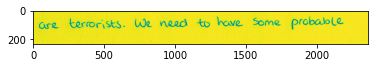

In [ ]:
img = plt.imread('/content/content/DeskewedTestLinesOriginal/001_53.png', format = 'gray')
plt.imshow(img[10:, :])
print(img.shape)

In [ ]:
# Loop through each folder
for file in tqdm(os.listdir(workingDirectory)):
    filePath = os.path.join(workingDirectory, file)
       
    imgPath = filePath
    img = plt.imread(imgPath, format='gray')
    h, w = img.shape
#             print(f'Old Size:{img.shape}', end = " ")
    extraPixel = False
    if h < 200:
        # Count extra pixels needed for 200
        extraPixelHeight = 200 - h
        hPoint = int(extraPixelHeight / 2)
    elif h > 200:
        # if height is greater than 200 read extra pixels and subtract them
        extraPixelHeight = h - 200
        hPoint = int(extraPixelHeight / 2)
        extraPixel = True
    if w % 200 != 0:
        rmd = w // 200 + 1
        newWidth = rmd * 200
        wPoint = int((rmd * 200 - w)  / 2)
    newSize = (newWidth, 200)
    
    img = Image.open(imgPath)
    img.load() 
    newImg = Image.new("L", newSize, (255))
#             print(f'\tNew Size:{newSize}')
    if extraPixel:
        newImg.paste(img, box = (wPoint, 0))
        newImg.save(newFolderPath + '/' + file)
        extraPixel = False
    else:
        newImg.paste(img, box = (wPoint, hPoint))
        newImg.save(newFolderPath + '/' + file)

#             break
#         break
#         print(subFolder)
#     break

100%|██████████| 547/547 [00:54<00:00, 10.11it/s]


In [ ]:
# os.mkdir('/content/drive/MyDrive/'+'26Sept_HandWritingData')

In [ ]:
!zip -r 200xResizedOriginalTestData.zip /content/content/DeskewedTestLinesOriginal
shutil.copy('/content/200xResizedOriginalTestData.zip', '/content/drive/MyDrive/26Sept_HandWritingData/')

  adding: content/content/DeskewedTestLinesOriginal/ (stored 0%)
  adding: content/content/DeskewedTestLinesOriginal/022_50.png (deflated 2%)
  adding: content/content/DeskewedTestLinesOriginal/046_52.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/025_63.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/058_60.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/052_60.png (deflated 2%)
  adding: content/content/DeskewedTestLinesOriginal/011_60.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/028_64.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/036_62.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/008_64.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/036_60.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/003_50.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/018_61.png (deflated 1%)
  adding: c

'/content/drive/MyDrive/26Sept_HandWritingData/200xResizedOriginalTestData.zip'

### Creating Patches of images with augmented data

In [ ]:
import numpy as np
import cv2

In [ ]:
def divideImageIntoHalfAugmented(filePath, destDirectory=None):
    # filePath = os.path.join(srcDirectory, file)
    try:
      orgImage = plt.imread(filePath)
    except IsADirectoryError:
      return
    for i in range(int(orgImage.shape[1])):
        cropImage = orgImage[:, 200 * i: 200 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1500:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            orgImgNeg = 1.0 - cropImage # Negative of original Image
            # Get Eroded Image
            # Taking a matrix of size 5 as the kernel
            kernel = np.ones((5,5), np.uint8)
            img_erosion = cv2.erode(cropImage, kernel, iterations=1)
            # Subtract eroded image from original image
            contImg = img_erosion - cropImage # Subtract eroded image from original Image
            contImgNeg = 1.0 - contImg    # Negative of contour Image

            # Sharp Image
            threshImageSharp = np.where(cropImage > 0.7, 0.9, 0)
            img_erosionSharp = cv2.erode(threshImageSharp, kernel, iterations=1)
            subSharp = img_erosionSharp - threshImageSharp
            threshImageSharpNeg = 1.0 - threshImageSharp
            subSharpNeg = 1.0 - subSharp
            
            # Store Images into list
            imagesList = [cropImage, contImg, threshImageSharp, subSharp, orgImgNeg, contImgNeg, threshImageSharpNeg, subSharpNeg]
            titleList = ["OrgImage", "OrgCnt", "SharpImg", "SharpCnt", "OrgNeg", "OrgCntNeg", "SharpImgNeg", "SharpCntNeg"]
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            # cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[i] + '.png', imagesList[i]) # Save gray image patch into current folder
            for j in range(len(imagesList)):
              fileName = destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[j] + '.png'
              plt.imsave(fileName, imagesList[j], cmap = "gray")
            # cv2_imshow(imagesList[i])
            # plt.imshow(imagesList[i], cmap = "gray")
            # Plot the images
            # fig,a =  plt.subplots(2,4,figsize=(10,10))
            
            # for i in range(len(imagesList)):
            #     if i < 4:
            #         a[0][i].imshow(imagesList[i], cmap = "gray")
            #         a[0][i].set_title(titleList[i])
            #     else:
            #         j = i - 4
            #         a[1][j].imshow(imagesList[i], cmap = "gray")
            #         a[1][j].set_title(titleList[i])
            # return cropImage
        # break

In [ ]:
# !rm -rf /content/200xresizedTrainWordSegAugmented

In [ ]:
srcDirectory = "/content/newTestLinesData"
destDirectory = "/content/200xresizedTestWordSegAugmented"
os.mkdir("200xresizedTestWordSegAugmented")
for file in tqdm(os.listdir(srcDirectory)):
    subPath = os.path.join(srcDirectory, file)
    divideImageIntoHalfAugmented(subPath, destDirectory)
    # print("Remaining:", (totalFiles - count))
    # count += 1

100%|██████████| 547/547 [06:53<00:00,  1.32it/s]


In [ ]:
print("Total Files:", len(os.listdir('/content/200xresizedTestWordSegAugmented')))

Total Files: 30272


In [ ]:
# Create a zip file of segmented train words 
!zip -r 200xResizedTestWordsSegmented.zip /content/200xresizedTestWordSegAugmented
shutil.copy('/content/200xResizedTestWordsSegmented.zip', '/content/drive/MyDrive/26Sept_HandWritingData/')

Streaming output truncated to the last 5000 lines.
  adding: content/200xresizedTestWordSegAugmented/070_52_2_SharpImg.png (deflated 16%)
  adding: content/200xresizedTestWordSegAugmented/002_52_7_OrgImage.png (deflated 2%)
  adding: content/200xresizedTestWordSegAugmented/059_54_6_SharpImgNeg.png (deflated 14%)
  adding: content/200xresizedTestWordSegAugmented/040_61_9_SharpImgNeg.png (deflated 11%)
  adding: content/200xresizedTestWordSegAugmented/035_54_3_OrgCnt.png (deflated 2%)
  adding: content/200xresizedTestWordSegAugmented/019_62_5_OrgCntNeg.png (deflated 3%)
  adding: content/200xresizedTestWordSegAugmented/042_52_9_OrgCnt.png (deflated 2%)
  adding: content/200xresizedTestWordSegAugmented/014_52_5_SharpCntNeg.png (deflated 10%)
  adding: content/200xresizedTestWordSegAugmented/038_63_1_SharpImgNeg.png (deflated 24%)
  adding: content/200xresizedTestWordSegAugmented/030_50_10_OrgNeg.png (deflated 2%)
  adding: content/200xresizedTestWordSegAugmented/032_53_2_SharpImgNeg.png (

'/content/drive/MyDrive/26Sept_HandWritingData/200xResizedTestWordsSegmented.zip'

# Preparing Data for SigNet
17 October 2022

## Adding Extra pixels to make lines size multiple of 200
26 September 2022


In [ ]:
from zipfile import ZipFile
import os
from tqdm import tqdm
import shutil
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

In [ ]:
# ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedImages.zip", "r")
# ref.extractall()
# ref.close()

In [ ]:
ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedLineImagesOriginal.zip", "r")
ref.extractall()
ref.close()

In [ ]:
workingDirectory = "/content/content/DeskewedLinesOriginal"

In [ ]:
os.mkdir(os.path.join(os.getcwd(), 'newLinesData'))
newFolderPath = os.path.join(os.getcwd(), 'newLinesData')

(211, 2457)


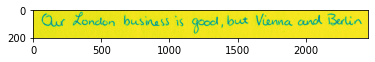

In [ ]:
img = plt.imread('/content/content/DeskewedLinesOriginal/001_10.png', format = 'gray')
plt.imshow(img[10:, :])
print(img.shape)

In [ ]:
# Loop through each folder
newH = 170
newW = 242
for file in tqdm(os.listdir(workingDirectory)):
    filePath = os.path.join(workingDirectory, file)
       
    imgPath = filePath
    img = plt.imread(imgPath, format='gray')
    h, w = img.shape
#             print(f'Old Size:{img.shape}', end = " ")
    extraPixel = False
    if h < newH:
        # Count extra pixels needed for 200
        extraPixelHeight = newH - h
        hPoint = int(extraPixelHeight / 2)
    elif h > newH:
        # if height is greater than 200 read extra pixels and subtract them
        extraPixelHeight = h - newH
        hPoint = int(extraPixelHeight / 2)
        extraPixel = True
    if w % newW != 0:
        rmd = w // newW + 1
        newWidth = rmd * newW
        wPoint = int((rmd * newW - w)  / 2)
    newSize = (newWidth, newH)
    
    img = Image.open(imgPath)
    img.load() 
    newImg = Image.new("L", newSize, (255))
#             print(f'\tNew Size:{newSize}')
    if extraPixel:
        newImg.paste(img, box = (wPoint, 0))
        newImg.save(newFolderPath + '/' + file)
        extraPixel = False
    else:
        newImg.paste(img, box = (wPoint, hPoint))
        newImg.save(newFolderPath + '/' + file)

#             break
#         break
#         print(subFolder)
#     break

100%|██████████| 1781/1781 [02:54<00:00, 10.19it/s]


In [ ]:
os.mkdir('/content/drive/MyDrive/'+'18OCtober_HandWritingDataSig')

In [ ]:
!zip -r SigNetResizedOriginalTrainData.zip /content/newLinesData
shutil.copy('/content/SigNetResizedOriginalTrainData.zip', '/content/drive/MyDrive/SigNetModel/')

updating: content/newLinesData/ (stored 0%)
updating: content/newLinesData/070_30.png (deflated 0%)
updating: content/newLinesData/019_25.png (deflated 0%)
updating: content/newLinesData/022_13.png (deflated 0%)
updating: content/newLinesData/042_12.png (deflated 0%)
updating: content/newLinesData/008_45.png (deflated 0%)
updating: content/newLinesData/024_17.png (deflated 0%)
updating: content/newLinesData/047_45.png (deflated 0%)
updating: content/newLinesData/055_31.png (deflated 0%)
updating: content/newLinesData/052_44.png (deflated 0%)
updating: content/newLinesData/035_22.png (deflated 1%)
updating: content/newLinesData/029_35.png (deflated 0%)
updating: content/newLinesData/035_17.png (deflated 0%)
updating: content/newLinesData/020_24.png (deflated 0%)
updating: content/newLinesData/014_36.png (deflated 0%)
updating: content/newLinesData/020_48.png (deflated 0%)
updating: content/newLinesData/021_24.png (deflated 0%)
updating: content/newLinesData/011_11.png (deflated 0%)
upda

'/content/drive/MyDrive/SigNetModel/SigNetResizedOriginalTrainData.zip'

### Creating Patches of images with augmented data

In [ ]:
import numpy as np
import cv2

In [ ]:
def divideImageIntoHalfAugmented(filePath, destDirectory=None):
    # filePath = os.path.join(srcDirectory, file)
    try:
      orgImage = plt.imread(filePath)
    except IsADirectoryError:
      return
    for i in range(int(orgImage.shape[1])):
        cropImage = orgImage[:, 242 * i: 242 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1500:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            orgImgNeg = 1.0 - cropImage # Negative of original Image
            # Get Eroded Image
            # Taking a matrix of size 5 as the kernel
            kernel = np.ones((5,5), np.uint8)
            img_erosion = cv2.erode(cropImage, kernel, iterations=1)
            # Subtract eroded image from original image
            contImg = img_erosion - cropImage # Subtract eroded image from original Image
            contImgNeg = 1.0 - contImg    # Negative of contour Image

            # Sharp Image
            threshImageSharp = np.where(cropImage > 0.7, 0.9, 0)
            img_erosionSharp = cv2.erode(threshImageSharp, kernel, iterations=1)
            subSharp = img_erosionSharp - threshImageSharp
            threshImageSharpNeg = 1.0 - threshImageSharp
            subSharpNeg = 1.0 - subSharp
            
            # Store Images into list
            imagesList = [cropImage, contImg, threshImageSharp, subSharp, orgImgNeg, contImgNeg, threshImageSharpNeg, subSharpNeg]
            titleList = ["OrgImage", "OrgCnt", "SharpImg", "SharpCnt", "OrgNeg", "OrgCntNeg", "SharpImgNeg", "SharpCntNeg"]
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            # cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[i] + '.png', imagesList[i]) # Save gray image patch into current folder
            for j in range(len(imagesList)):
              fileName = destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[j] + '.png'
              plt.imsave(fileName, imagesList[j], cmap = "gray")
            # cv2_imshow(imagesList[i])
            # plt.imshow(imagesList[i], cmap = "gray")
            # Plot the images
            # fig,a =  plt.subplots(2,4,figsize=(10,10))
            
            # for i in range(len(imagesList)):
            #     if i < 4:
            #         a[0][i].imshow(imagesList[i], cmap = "gray")
            #         a[0][i].set_title(titleList[i])
            #     else:
            #         j = i - 4
            #         a[1][j].imshow(imagesList[i], cmap = "gray")
            #         a[1][j].set_title(titleList[i])
            # return cropImage
        # break

In [ ]:
# !rm -rf /content/200xresizedTrainWordSegAugmented

In [ ]:
srcDirectory = "/content/newLinesData"
destDirectory = "/content/SigNetresizedTrainWordSegAugmented"
os.mkdir("SigNetresizedTrainWordSegAugmented")
for file in tqdm(os.listdir(srcDirectory)):
    subPath = os.path.join(srcDirectory, file)
    divideImageIntoHalfAugmented(subPath, destDirectory)
    # print("Remaining:", (totalFiles - count))
    # count += 1

100%|██████████| 1781/1781 [24:11<00:00,  1.23it/s]


In [ ]:
print("Total Files:", len(os.listdir('/content/SigNetresizedTrainWordSegAugmented')))

Total Files: 97896


### Description 
SigNetResizedTrainWordsSegmented contains resized semented data from Dr Imran dataset. The  size has been adjusted according to SigNet Model

In [ ]:
# Create a zip file of segmented train words 
!zip -r SigNetResizedTrainWordsSegmented.zip /content/SigNetresizedTrainWordSegAugmented
shutil.copy('/content/SigNetResizedTrainWordsSegmented.zip', '/content/drive/MyDrive/SigNetModel/')

Streaming output truncated to the last 5000 lines.
  adding: content/SigNetresizedTrainWordSegAugmented/034_27_8_SharpImg.png (deflated 10%)
  adding: content/SigNetresizedTrainWordSegAugmented/019_110_7_SharpCnt.png (deflated 8%)
  adding: content/SigNetresizedTrainWordSegAugmented/050_42_0_OrgCntNeg.png (deflated 3%)
  adding: content/SigNetresizedTrainWordSegAugmented/036_27_6_SharpCntNeg.png (deflated 9%)
  adding: content/SigNetresizedTrainWordSegAugmented/073_45_9_OrgImage.png (deflated 3%)
  adding: content/SigNetresizedTrainWordSegAugmented/029_14_1_OrgCntNeg.png (deflated 3%)
  adding: content/SigNetresizedTrainWordSegAugmented/034_46_2_OrgImage.png (deflated 2%)
  adding: content/SigNetresizedTrainWordSegAugmented/014_44_3_OrgCntNeg.png (deflated 3%)
  adding: content/SigNetresizedTrainWordSegAugmented/007_14_9_OrgCntNeg.png (deflated 3%)
  adding: content/SigNetresizedTrainWordSegAugmented/025_25_8_SharpCntNeg.png (deflated 9%)
  adding: content/SigNetresizedTrainWordSegAugm

'/content/drive/MyDrive/SigNetModel/SigNetResizedTrainWordsSegmented.zip'

## Adding Extra pixels on Test Data to make lines size multiple of 200
26 September 2022


In [ ]:
from zipfile import ZipFile
import os
from tqdm import tqdm
import shutil
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

In [ ]:
# ref = ZipFile("/content/drive/MyDrive/HandWritingRecognition/DeskewedImages.zip", "r")
# ref.extractall()
# ref.close()

In [ ]:
ref = ZipFile("/content/drive/MyDrive/handWritingTestWords/DeskewedTestLineImagesOriginal.zip", "r")
ref.extractall()
ref.close()

In [ ]:
workingDirectory = "/content/content/DeskewedTestLinesOriginal"

In [ ]:
os.mkdir(os.path.join(os.getcwd(), 'newTestLinesData'))
newFolderPath = os.path.join(os.getcwd(), 'newTestLinesData')

(241, 2361)


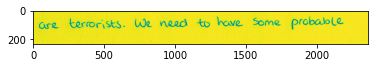

In [ ]:
img = plt.imread('/content/content/DeskewedTestLinesOriginal/001_53.png', format = 'gray')
plt.imshow(img[10:, :])
print(img.shape)

In [ ]:
# Loop through each folder
newH = 170
newW = 242
for file in tqdm(os.listdir(workingDirectory)):
    filePath = os.path.join(workingDirectory, file)
       
    imgPath = filePath
    img = plt.imread(imgPath, format='gray')
    h, w = img.shape
#             print(f'Old Size:{img.shape}', end = " ")
    extraPixel = False
    if h < newH:
        # Count extra pixels needed for 200
        extraPixelHeight = newH - h
        hPoint = int(extraPixelHeight / 2)
    elif h > newH:
        # if height is greater than 200 read extra pixels and subtract them
        extraPixelHeight = h - newH
        hPoint = int(extraPixelHeight / 2)
        extraPixel = True
    if w % newW != 0:
        rmd = w // newW + 1
        newWidth = rmd * newW
        wPoint = int((rmd * newW - w)  / 2)
    newSize = (newWidth, newH)
    
    img = Image.open(imgPath)
    img.load() 
    newImg = Image.new("L", newSize, (255))
#             print(f'\tNew Size:{newSize}')
    if extraPixel:
        newImg.paste(img, box = (wPoint, 0))
        newImg.save(newFolderPath + '/' + file)
        extraPixel = False
    else:
        newImg.paste(img, box = (wPoint, hPoint))
        newImg.save(newFolderPath + '/' + file)

#             break
#         break
#         print(subFolder)
#     break

100%|██████████| 547/547 [00:48<00:00, 11.38it/s]


In [ ]:
# os.mkdir('/content/drive/MyDrive/'+'26Sept_HandWritingData')

In [ ]:
!zip -r SigNetdOriginalTestData.zip /content/content/DeskewedTestLinesOriginal
shutil.copy('/content/SigNetdOriginalTestData.zip', '/content/drive/MyDrive/SigNetModel/')

  adding: content/content/DeskewedTestLinesOriginal/ (stored 0%)
  adding: content/content/DeskewedTestLinesOriginal/073_61.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/031_53.png (deflated 2%)
  adding: content/content/DeskewedTestLinesOriginal/035_53.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/033_60.png (deflated 2%)
  adding: content/content/DeskewedTestLinesOriginal/034_63.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/050_64.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/046_64.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/060_60.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/035_51.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/017_60.png (deflated 2%)
  adding: content/content/DeskewedTestLinesOriginal/021_62.png (deflated 1%)
  adding: content/content/DeskewedTestLinesOriginal/043_51.png (deflated 2%)
  adding: c

'/content/drive/MyDrive/SigNetModel/SigNetdOriginalTestData.zip'

### Creating Patches of images with augmented data

In [ ]:
import numpy as np
import cv2

In [ ]:
def divideImageIntoHalfAugmented(filePath, destDirectory=None):
    # filePath = os.path.join(srcDirectory, file)
    try:
      orgImage = plt.imread(filePath)
    except IsADirectoryError:
      return
    for i in range(int(orgImage.shape[1])):
        cropImage = orgImage[:, 242 * i: 242 * (i+1)] # Crop the original image into parts
        threshImage = np.where(cropImage > 0.7, 0, 1) # Apply threshold on image
        # sobel_image = sobel(threshImage)
        # hpp = np.sum(sobel_image, axis=0)
        pixelSum = np.sum(threshImage)
        # print("Pixel Sum:", pixelSum)
        if pixelSum > 1500:      # Check if the cropped image contain text in it only then process it otherwise ignore it
            orgImgNeg = 1.0 - cropImage # Negative of original Image
            # Get Eroded Image
            # Taking a matrix of size 5 as the kernel
            kernel = np.ones((5,5), np.uint8)
            img_erosion = cv2.erode(cropImage, kernel, iterations=1)
            # Subtract eroded image from original image
            contImg = img_erosion - cropImage # Subtract eroded image from original Image
            contImgNeg = 1.0 - contImg    # Negative of contour Image

            # Sharp Image
            threshImageSharp = np.where(cropImage > 0.7, 0.9, 0)
            img_erosionSharp = cv2.erode(threshImageSharp, kernel, iterations=1)
            subSharp = img_erosionSharp - threshImageSharp
            threshImageSharpNeg = 1.0 - threshImageSharp
            subSharpNeg = 1.0 - subSharp
            
            # Store Images into list
            imagesList = [cropImage, contImg, threshImageSharp, subSharp, orgImgNeg, contImgNeg, threshImageSharpNeg, subSharpNeg]
            titleList = ["OrgImage", "OrgCnt", "SharpImg", "SharpCnt", "OrgNeg", "OrgCntNeg", "SharpImgNeg", "SharpCntNeg"]
            fileNumber = os.path.splitext(file)[0] # Get file number form file name
            # cv2.imwrite(destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[i] + '.png', imagesList[i]) # Save gray image patch into current folder
            for j in range(len(imagesList)):
              fileName = destDirectory + '/' + fileNumber + "_" + str(i) + "_"+ titleList[j] + '.png'
              plt.imsave(fileName, imagesList[j], cmap = "gray")
            # cv2_imshow(imagesList[i])
            # plt.imshow(imagesList[i], cmap = "gray")
            # Plot the images
            # fig,a =  plt.subplots(2,4,figsize=(10,10))
            
            # for i in range(len(imagesList)):
            #     if i < 4:
            #         a[0][i].imshow(imagesList[i], cmap = "gray")
            #         a[0][i].set_title(titleList[i])
            #     else:
            #         j = i - 4
            #         a[1][j].imshow(imagesList[i], cmap = "gray")
            #         a[1][j].set_title(titleList[i])
            # return cropImage
        # break

In [ ]:
# !rm -rf /content/200xresizedTrainWordSegAugmented

In [ ]:
srcDirectory = "/content/newTestLinesData"
destDirectory = "/content/200xresizedTestWordSegAugmented"
os.mkdir("200xresizedTestWordSegAugmented")
for file in tqdm(os.listdir(srcDirectory)):
    subPath = os.path.join(srcDirectory, file)
    divideImageIntoHalfAugmented(subPath, destDirectory)
    # print("Remaining:", (totalFiles - count))
    # count += 1

100%|██████████| 547/547 [07:36<00:00,  1.20it/s]


In [ ]:
print("Total Files:", len(os.listdir('/content/200xresizedTestWordSegAugmented')))

Total Files: 31592


In [ ]:
# Create a zip file of segmented train words 
!zip -r SigNetResizedTestWordsSegmented.zip /content/200xresizedTestWordSegAugmented
shutil.copy('/content/SigNetResizedTestWordsSegmented.zip', '/content/drive/MyDrive/SigNetModel/')

Streaming output truncated to the last 5000 lines.
  adding: content/200xresizedTestWordSegAugmented/036_52_1_OrgCntNeg.png (deflated 2%)
  adding: content/200xresizedTestWordSegAugmented/059_51_0_SharpCnt.png (deflated 8%)
  adding: content/200xresizedTestWordSegAugmented/057_62_6_SharpImg.png (deflated 9%)
  adding: content/200xresizedTestWordSegAugmented/041_61_8_SharpImg.png (deflated 13%)
  adding: content/200xresizedTestWordSegAugmented/025_62_4_OrgImage.png (deflated 1%)
  adding: content/200xresizedTestWordSegAugmented/055_50_9_SharpCnt.png (deflated 16%)
  adding: content/200xresizedTestWordSegAugmented/041_63_2_SharpCntNeg.png (deflated 10%)
  adding: content/200xresizedTestWordSegAugmented/051_62_2_SharpCntNeg.png (deflated 15%)
  adding: content/200xresizedTestWordSegAugmented/007_60_1_SharpImgNeg.png (deflated 8%)
  adding: content/200xresizedTestWordSegAugmented/046_50_8_SharpCntNeg.png (deflated 8%)
  adding: content/200xresizedTestWordSegAugmented/039_62_7_SharpCnt.png 

'/content/drive/MyDrive/SigNetModel/SigNetResizedTestWordsSegmented.zip'

# Test codes

In [ ]:
orgImgNeg = 1.0 - cropImage # Negative of original Image
            # Get Eroded Image
            # Taking a matrix of size 5 as the kernel
            kernel = np.ones((5,5), np.uint8)
            img_erosion = cv2.erode(cropImage, kernel, iterations=1)
            # Subtract eroded image from original image
            contImg = img_erosion - cropImage # Subtract eroded image from original Image
            contImgNeg = 1.0 - contImg    # Negative of contour Image

            # Sharp Image
            threshImageSharp = np.where(cropImage > 0.7, 0.9, 0)
            img_erosionSharp = cv2.erode(threshImageSharp, kernel, iterations=1)
            subSharp = img_erosionSharp - threshImageSharp
            threshImageSharpNeg = 1.0 - threshImageSharp
            subSharpNeg = 1.0 - subSharp
            
            

IndentationError: ignored

In [ ]:
imgPath = "/content/content/DeskewedLinesResized/019_40.png"

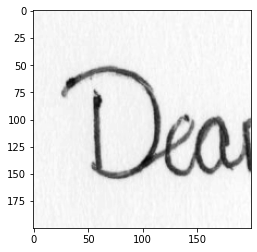

In [ ]:
gray = plt.imread(imgPath)[:, :200]
plt.imshow(gray, cmap = "gray")

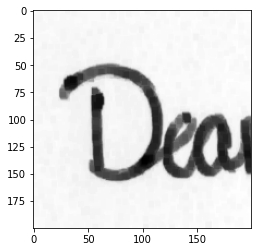

In [ ]:
kernel = np.ones((5,5), np.uint8)
 
img_erosion = cv2.erode(gray, kernel, iterations=1)
plt.imshow(img_erosion, cmap = "gray")

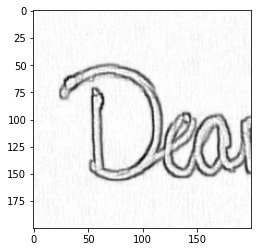

In [ ]:
sub = img_erosion - gray # Subtract eroded image from original Image
plt.imshow(sub, cmap = "gray")

In [ ]:
threshImage = np.where(gray > 0.7, 1.0, 0)

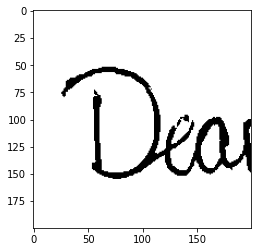

In [ ]:
plt.imshow(threshImage, cmap = "gray")

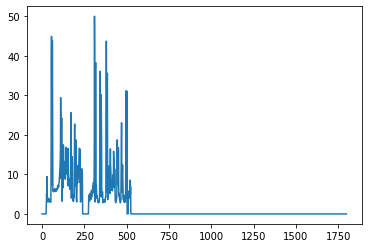

In [ ]:
from skimage.filters import sobel
import numpy as np
def horizontal_projections(sobel_image):
    return np.sum(sobel_image, axis=0)  

sobel_image = sobel(threshImage)
hpp = horizontal_projections(sobel_image) 
plt.plot(np.sum(sobel_image, axis=0)
plt.show()

In [ ]:
np.sum(threshImage[:, 600:1000])

0.0

In [ ]:
negImage = 1.0-gray

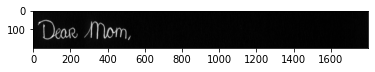

In [ ]:
plt.imshow(negImage, cmap = "gray")

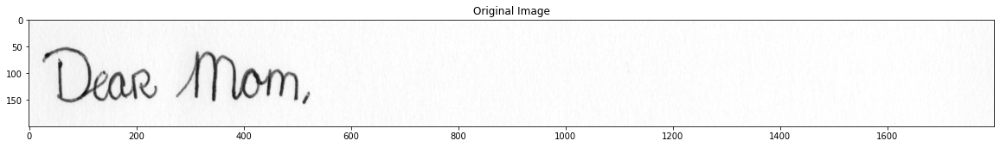

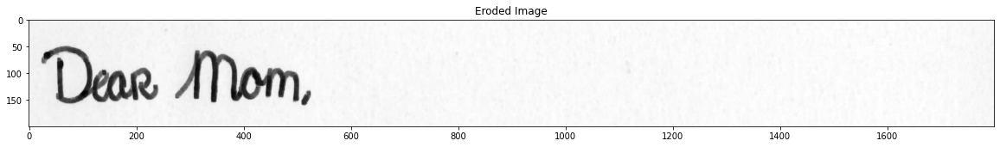

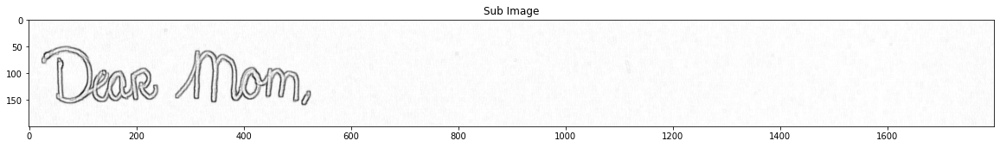

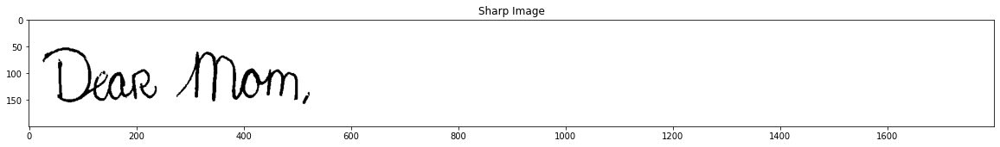

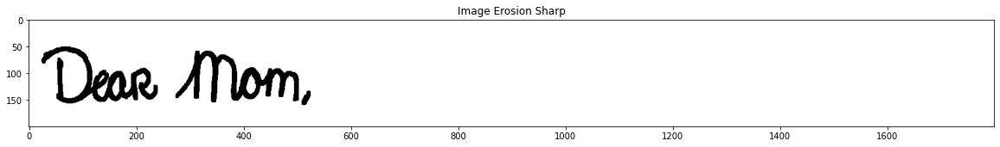

...

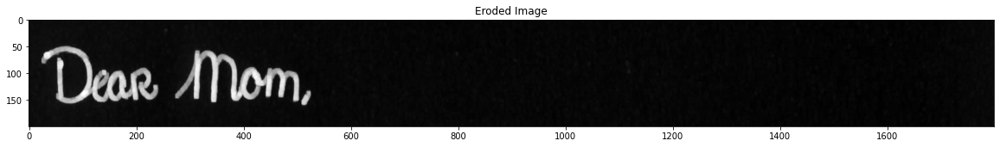

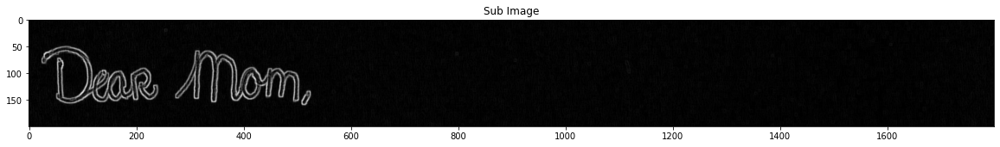

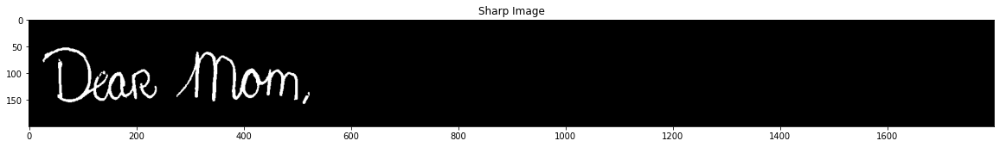

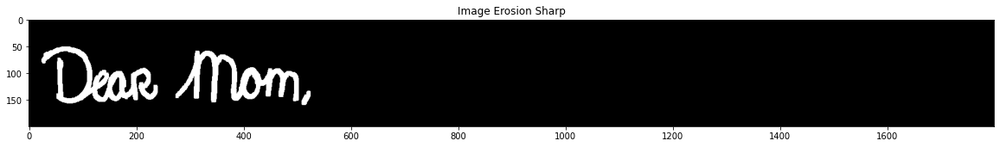

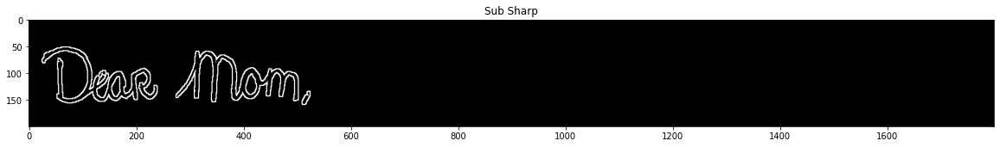

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
 
# Reading the input image
# img = cv2.imread('input.png', 0)
 
# Taking a matrix of size 5 as the kernel
kernel = np.ones((5,5), np.uint8)
 
# The first parameter is the original image,
# kernel is the matrix with which image is
# convolved and third parameter is the number
# of iterations, which will determine how much
# you want to erode/dilate a given image.
img_erosion = cv2.erode(gray, kernel, iterations=1)
img_dilation = cv2.dilate(gray, kernel, iterations=1)

sub = img_erosion - gray # Subtract eroded image from original Image
kernelSharp = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])

image_sharp = cv2.filter2D(src=gray, ddepth=-1, kernel=kernelSharp)
threshImage = np.where(gray > 0.7, 0.9, 0)
img_erosionSharp = cv2.erode(threshImage, kernel, iterations=1)
subSharp = img_erosionSharp - threshImage
plt.figure(figsize = (20, 400))
plt.title("Original Image")
plt.imshow(gray, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Eroded Image")
plt.imshow(img_erosion, cmap = "gray")
# plt.figure(figsize = (20, 400))
# plt.imshow(img_dilation, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Sub Image")
plt.imshow(sub, cmap = "gray")
# plt.figure(figsize = (20, 400))
# plt.imshow(image_sharp, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Sharp Image")
plt.imshow(threshImage, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Image Erosion Sharp")
plt.imshow(img_erosionSharp, cmap = "gray")

plt.figure(figsize = (20, 400))
plt.title("Sub Sharp")
plt.imshow(subSharp, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Original Image")
plt.imshow(1.0 - gray, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Eroded Image")
plt.imshow(1.0 - img_erosion, cmap = "gray")
# plt.figure(figsize = (20, 400))
# plt.imshow(img_dilation, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Sub Image")
plt.imshow(1.0 - sub, cmap = "gray")
# plt.figure(figsize = (20, 400))
# plt.imshow(image_sharp, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Sharp Image")
plt.imshow(1.0 - threshImage, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.title("Image Erosion Sharp")
plt.imshow(1.0 - img_erosionSharp, cmap = "gray")

plt.figure(figsize = (20, 400))
plt.title("Sub Sharp")
plt.imshow(1.0 - subSharp, cmap = "gray")
 
# cv2.waitKey(0)

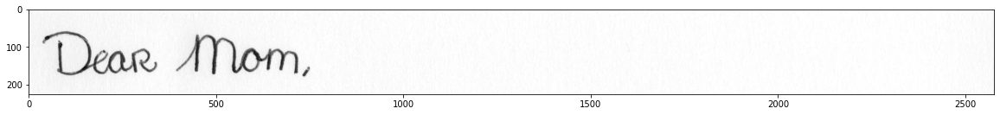

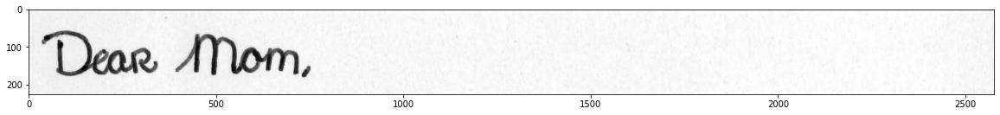

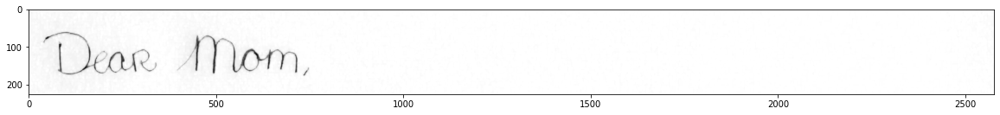

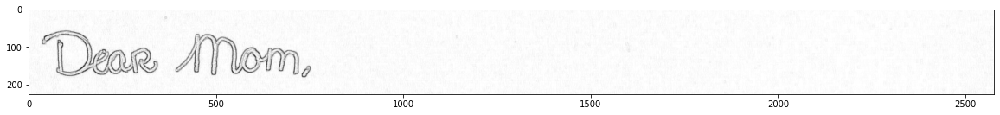

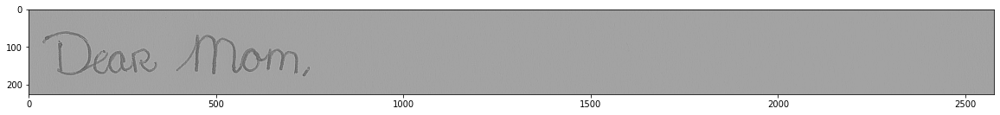

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
 
# Reading the input image
# img = cv2.imread('input.png', 0)
 
# Taking a matrix of size 5 as the kernel
kernel = np.ones((5,5), np.uint8)
 
# The first parameter is the original image,
# kernel is the matrix with which image is
# convolved and third parameter is the number
# of iterations, which will determine how much
# you want to erode/dilate a given image.
img_erosion = cv2.erode(gray, kernel, iterations=1)
img_dilation = cv2.dilate(gray, kernel, iterations=1)

sub = img_erosion - gray # Subtract eroded image from original Image
kernel = np.array([[0, -1, 0],
                   [-1, 5,-1],
                   [0, -1, 0]])

kernel = np.array([[-1,-1,-1], 
                       [-1, 9,-1],
                       [-1,-1,-1]])

image_sharp = cv2.filter2D(src=gray, ddepth=-1, kernel=kernel)

plt.figure(figsize = (20, 400))
plt.imshow(gray, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.imshow(img_erosion, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.imshow(img_dilation, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.imshow(sub, cmap = "gray")
plt.figure(figsize = (20, 400))
plt.imshow(image_sharp, cmap = "gray")
 
# cv2.waitKey(0)

In [ ]:
import os
os.mkdir("DeskewedLines")

In [ ]:
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

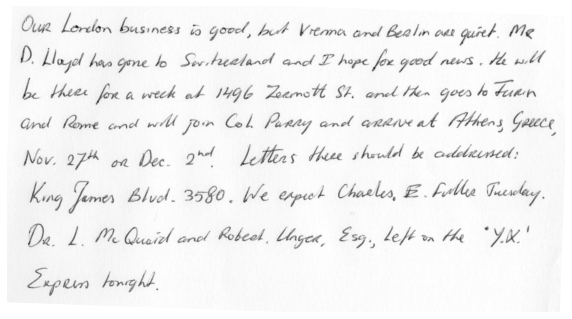

In [ ]:
img = rgb2gray(imread("/content/content/deskewedImages/027_001.png"))
# img = rgb2gray(rotatedImage)
plt.figure(figsize=(10,10))
plt.axis("off")
plt.imshow(img, cmap="gray")
plt.show()

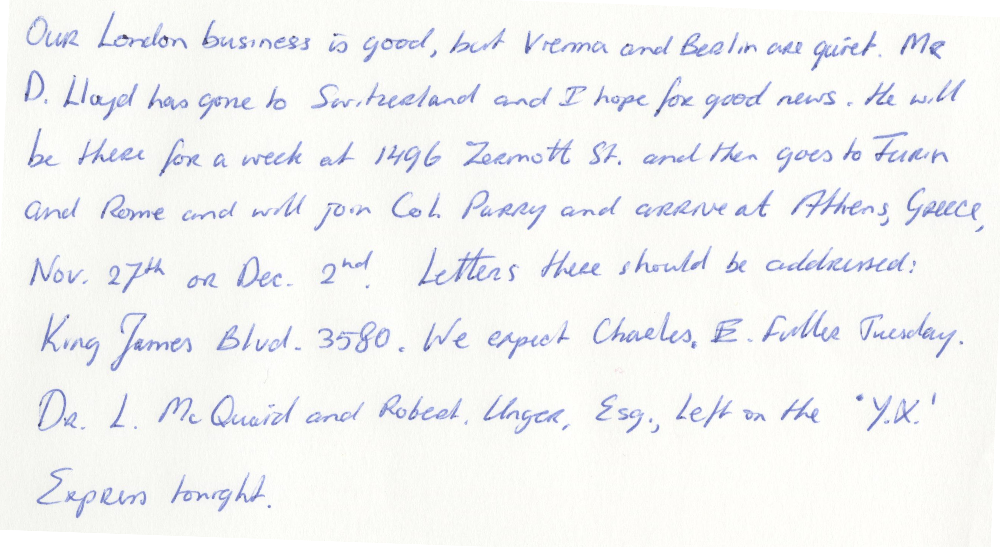

In [ ]:
imgOrg = cv2.imread("/content/content/deskewedImages/027_001.png")
cv2_imshow(imgOrg)

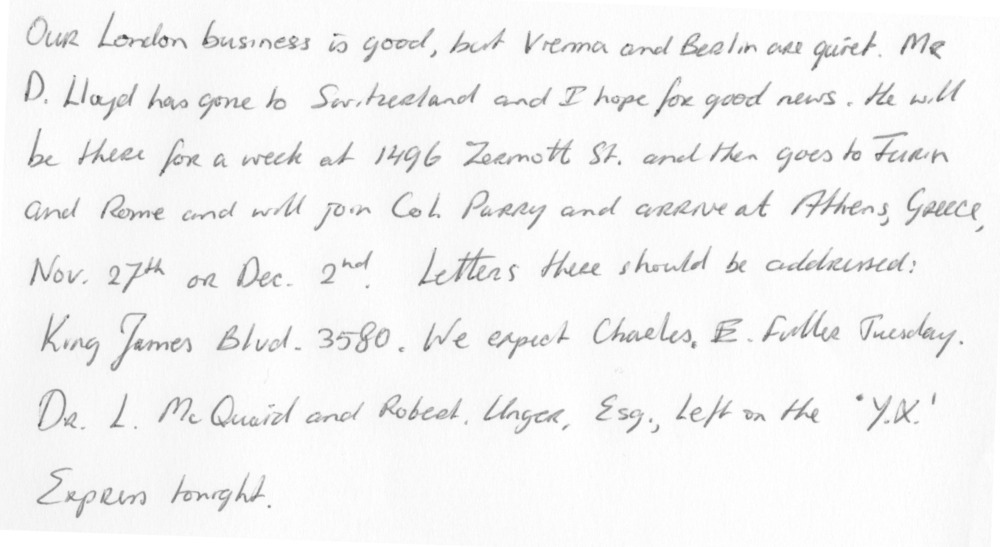

<Figure size 720x720 with 0 Axes>

In [ ]:
plt.figure(figsize = (10, 10))
gray = cv2.cvtColor(imgOrg,cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

In [ ]:
gray.shape

(1447, 2643)

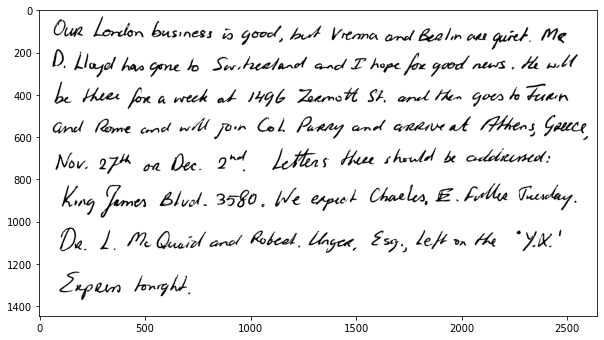

In [ ]:
plt.figure(figsize = (10, 10))
(thresh, im_bw) = cv2.threshold(gray, 140, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
plt.imshow(im_bw, cmap="gray")

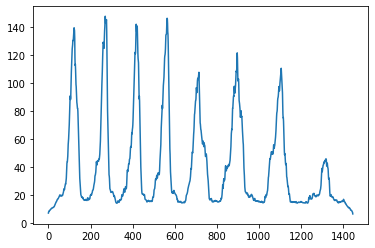

In [ ]:
from skimage.filters import sobel
import numpy as np
def horizontal_projections(sobel_image):
    return np.sum(sobel_image, axis=1)  

sobel_image = sobel(gray)
hpp = horizontal_projections(sobel_image) 
plt.plot(hpp)
plt.show()

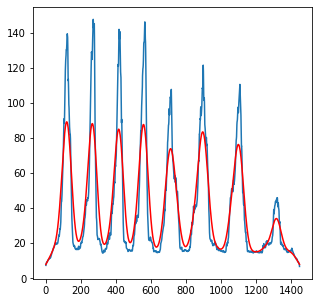

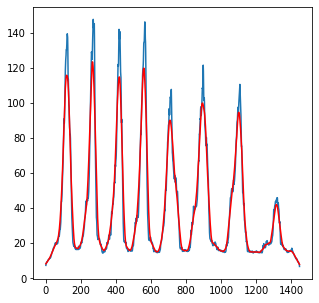

In [ ]:

from scipy.signal import chirp, find_peaks, peak_widths
from scipy.signal import savgol_filter

yhat1 = savgol_filter(hpp, 31, 1) # window size 51, polynomial order 3
yhat = savgol_filter(yhat1, 31, 1) # window size 51, polynomial order 3
yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3
yhat = savgol_filter(yhat, 31, 1) # window size 51, polynomial order 3

plt.figure(figsize = (5, 5))
plt.plot(hpp)
plt.plot(yhat, color='red')
plt.figure(figsize = (5, 5))
plt.plot(hpp)
plt.plot(yhat1, color='red')
plt.show()

In [ ]:
peaks, _ = find_peaks(yhat)
results_half = peak_widths(yhat, peaks, rel_height=0.5)

In [ ]:
results_half[0]  # widths

array([67.88924467, 59.28154593, 60.1900763 , 60.39369343, 70.8834106 ,
       72.96947668, 72.86295293, 65.54423859])

In [ ]:
results_full = peak_widths(yhat, peaks, rel_height=1)
results_full[0]  # widths

array([1445.75726208,  136.51631333,  139.02224157,  284.91547   ,
        161.83295619,  348.06304465,  174.6805376 ,  195.239429  ])

In [ ]:
results_half[1:]

(array([49.10596714, 55.19229637, 53.24775254, 54.16492795, 46.47763327,
        51.21699143, 46.95755646, 24.53430901]),
 array([  84.17528226,  233.73453573,  383.72039171,  525.23827796,
         676.91969559,  855.77241296, 1057.93760689, 1279.84906996]),
 array([ 152.06452692,  293.01608166,  443.91046801,  585.63197138,
         747.80310619,  928.74188964, 1130.80055981, 1345.39330855]))

In [ ]:
peaks

array([ 119,  265,  415,  556,  711,  894, 1097, 1314])

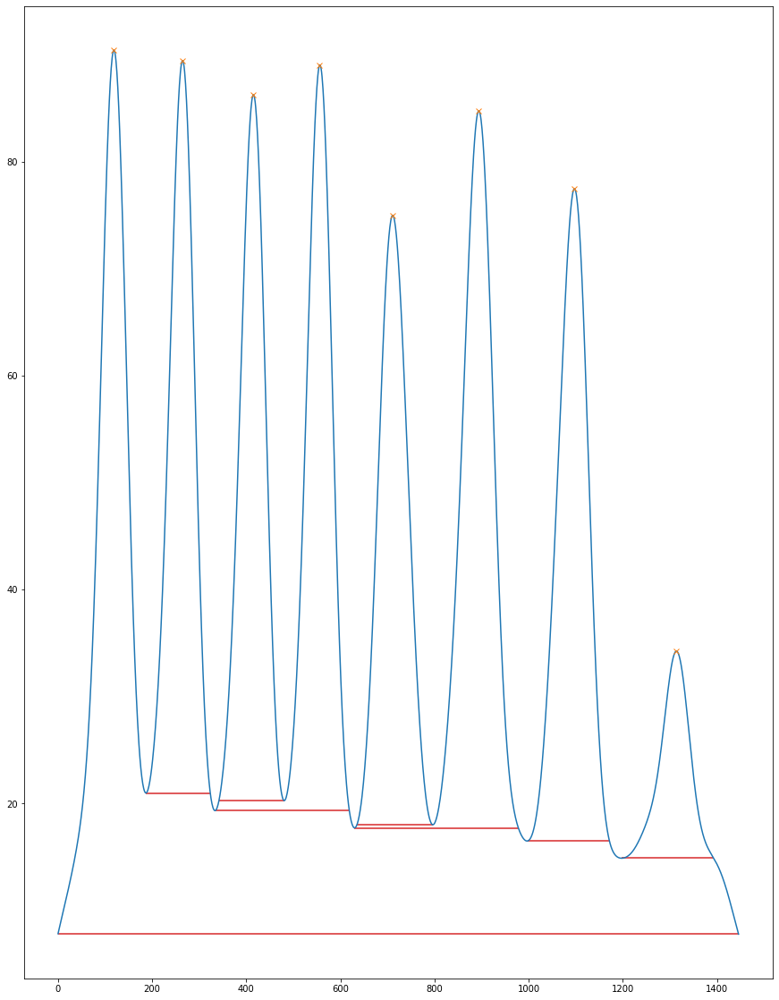

In [ ]:
plt.figure(figsize=(15, 20))
plt.plot(yhat)
plt.plot(peaks, yhat[peaks], "x")
# plt.hlines(*results_half[1:], color="C2")
plt.hlines(*results_full[1:], color="C3")
plt.show()

In [ ]:
!pip install findpeaks

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 44 kB 1.9 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=02926676c47fccdf75ae06212a176b636adf7906566bd04cb6b17406ea4c616e
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [ ]:
from findpeaks import findpeaks


[findpeaks] >Finding peaks in 1d-vector using [peakdetect] method..


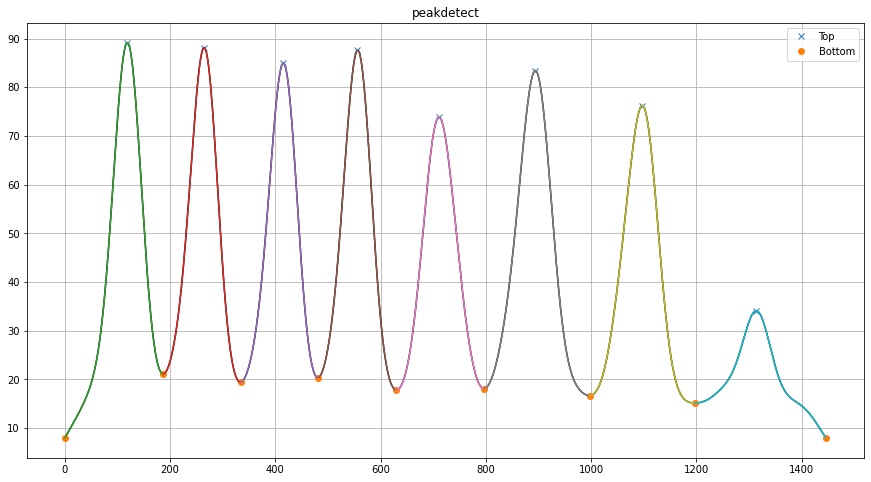

(None, <matplotlib.axes._subplots.AxesSubplot at 0x7f88441c9bd0>)

In [ ]:
# Initialize
fp = findpeaks(lookahead=1)
results = fp.fit(yhat)
# Plot
fp.plot()

In [ ]:
breakPoints = []
for val, index in zip(results['df']['valley'], range(len(results['df']['valley']))):
  # print(val)
  if val:
    breakPoints.append(index)

In [ ]:
breakPoints

[0, 187, 334, 481, 630, 797, 997, 1197, 1446]

In [ ]:
for file in os.listdir("/content/content/deskewedImages"):
  fileName = file
  break

In [ ]:
fileName

'052_001.png'

In [ ]:
fileNumber = os.path.splitext(fileName)[0].split('_')[1][-1] # Get file number form file name
fileNumber

'1'

In [ ]:
for i in range(len(breakPoints)-1):
  print(i, breakPoints[i], breakPoints[i+1])

0 0 187
1 187 334
2 334 481
3 481 630
4 630 797
5 797 997
6 997 1197
7 1197 1446


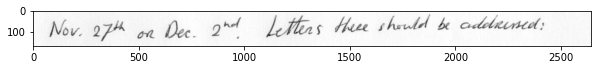

In [ ]:
plt.figure(figsize = (10, 10))
plt.imshow(img[breakPoints[4]:breakPoints[5]], cmap = "gray")

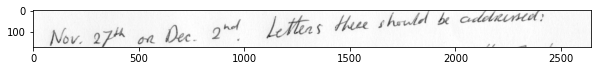

In [ ]:
plt.figure(figsize = (10, 10))
plt.imshow(img[breakPoints[4]:breakPoints[5]], cmap = "gray")

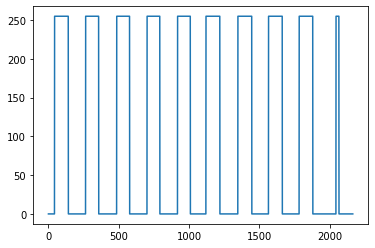

In [ ]:
plt.plot(y1)

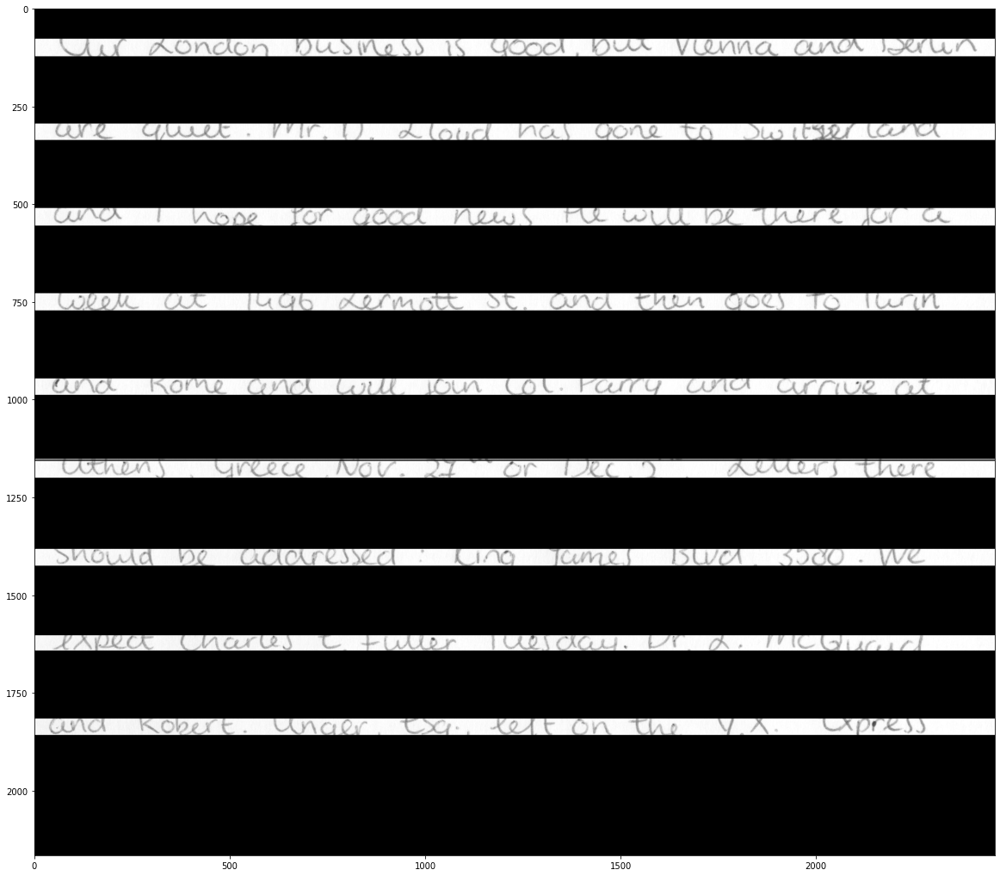

In [ ]:
#find the midway where we can make a threshold and extract the peaks regions
#divider parameter value is used to threshold the peak values from non peak values.
def find_peak_regions(hpp, divider=2):
    threshold = (np.max(hpp)-np.min(hpp))/divider
    peaks = []
    peaks_index = []
    for i, hppv in enumerate(hpp):
        if hppv < threshold:
            peaks.append([i, hppv])
    return peaks

peaks = find_peak_regions(hpp)

peaks_index = np.array(peaks)[:,0].astype(int)

segmented_img = np.copy(img)
r,c = segmented_img.shape
for ri in range(r):
    if ri in peaks_index:
        segmented_img[ri, :] = 0
        
plt.figure(figsize=(20,20))
plt.imshow(segmented_img, cmap="gray")
plt.show()

In [ ]:
#group the peaks into walking windows
def get_hpp_walking_regions(peaks_index):
    hpp_clusters = []
    cluster = []
    for index, value in enumerate(peaks_index):
        cluster.append(value)

        if index < len(peaks_index)-1 and peaks_index[index+1] - value > 1:
            hpp_clusters.append(cluster)
            cluster = []

        #get the last cluster
        if index == len(peaks_index)-1:
            hpp_clusters.append(cluster)
            cluster = []
            
    return hpp_clusters

hpp_clusters = get_hpp_walking_regions(peaks_index)

In [ ]:
#a star path planning algorithm 
from heapq import *

def heuristic(a, b):
    return (b[0] - a[0]) ** 2 + (b[1] - a[1]) ** 2

def astar(array, start, goal):

    neighbors = [(0,1),(0,-1),(1,0),(-1,0),(1,1),(1,-1),(-1,1),(-1,-1)]
    close_set = set()
    came_from = {}
    gscore = {start:0}
    fscore = {start:heuristic(start, goal)}
    oheap = []

    heappush(oheap, (fscore[start], start))
    
    while oheap:

        current = heappop(oheap)[1]

        if current == goal:
            data = []
            while current in came_from:
                data.append(current)
                current = came_from[current]
            return data

        close_set.add(current)
        for i, j in neighbors:
            neighbor = current[0] + i, current[1] + j            
            tentative_g_score = gscore[current] + heuristic(current, neighbor)
            if 0 <= neighbor[0] < array.shape[0]:
                if 0 <= neighbor[1] < array.shape[1]:                
                    if array[neighbor[0]][neighbor[1]] == 1:
                        continue
                else:
                    # array bound y walls
                    continue
            else:
                # array bound x walls
                continue
                
            if neighbor in close_set and tentative_g_score >= gscore.get(neighbor, 0):
                continue
                
            if  tentative_g_score < gscore.get(neighbor, 0) or neighbor not in [i[1]for i in oheap]:
                came_from[neighbor] = current
                gscore[neighbor] = tentative_g_score
                fscore[neighbor] = tentative_g_score + heuristic(neighbor, goal)
                heappush(oheap, (fscore[neighbor], neighbor))
                
    return []

In [ ]:
#Scan the paths to see if there are any blockers.
from skimage.filters import threshold_otsu
from skimage.util import invert

def get_binary(img):
    mean = np.mean(img)
    if mean == 0.0 or mean == 1.0:
        return img

    thresh = threshold_otsu(img)
    binary = img <= thresh
    binary = binary*1
    return binary

def path_exists(window_image):
    #very basic check first then proceed to A* check
    if 0 in horizontal_projections(window_image):
        return True
    
    padded_window = np.zeros((window_image.shape[0],1))
    world_map = np.hstack((padded_window, np.hstack((window_image,padded_window)) ) )
    path = np.array(astar(world_map, (int(world_map.shape[0]/2), 0), (int(world_map.shape[0]/2), world_map.shape[1])))
    if len(path) > 0:
        return True
    
    return False

def get_road_block_regions(nmap):
    road_blocks = []
    needtobreak = False
    
    for col in range(nmap.shape[1]):
        start = col
        end = col+20
        if end > nmap.shape[1]-1:
            end = nmap.shape[1]-1
            needtobreak = True

        if path_exists(nmap[:, start:end]) == False:
            road_blocks.append(col)

        if needtobreak == True:
            break
            
    return road_blocks

def group_the_road_blocks(road_blocks):
    #group the road blocks
    road_blocks_cluster_groups = []
    road_blocks_cluster = []
    size = len(road_blocks)
    for index, value in enumerate(road_blocks):
        road_blocks_cluster.append(value)
        if index < size-1 and (road_blocks[index+1] - road_blocks[index]) > 1:
            road_blocks_cluster_groups.append([road_blocks_cluster[0], road_blocks_cluster[len(road_blocks_cluster)-1]])
            road_blocks_cluster = []

        if index == size-1 and len(road_blocks_cluster) > 0:
            road_blocks_cluster_groups.append([road_blocks_cluster[0], road_blocks_cluster[len(road_blocks_cluster)-1]])
            road_blocks_cluster = []

    return road_blocks_cluster_groups

binary_image = get_binary(img)



In [ ]:
for cluster_of_interest in hpp_clusters:
    # print(cluster_of_interest)
    nmap = binary_image[cluster_of_interest[0]:cluster_of_interest[len(cluster_of_interest)-1],:]
    road_blocks = get_road_block_regions(nmap)
    road_blocks_cluster_groups = group_the_road_blocks(road_blocks)
    #create the doorways
    for index, road_blocks in enumerate(road_blocks_cluster_groups):
        window_image = nmap[:, road_blocks[0]: road_blocks[1]+10]
        try:
          binary_image[cluster_of_interest[0]:cluster_of_interest[len(cluster_of_interest)-1],:][:, road_blocks[0]: road_blocks[1]+10][int(window_image.shape[0]/2),:] *= 0
        except IndexError:
          pass

In [ ]:
#now that everything is cleaner, its time to segment all the lines using the A* algorithm
line_segments = []
for i, cluster_of_interest in enumerate(hpp_clusters):
    nmap = binary_image[cluster_of_interest[0]:cluster_of_interest[len(cluster_of_interest)-1],:]
    path = np.array(astar(nmap, (int(nmap.shape[0]/2), 0), (int(nmap.shape[0]/2),nmap.shape[1]-1)))
    offset_from_top = cluster_of_interest[0]
    path[:,0] += offset_from_top
    line_segments.append(path)

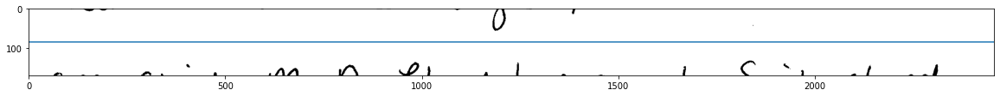

In [ ]:
cluster_of_interest = hpp_clusters[1]
offset_from_top = cluster_of_interest[0]
nmap = binary_image[cluster_of_interest[0]:cluster_of_interest[len(cluster_of_interest)-1],:]
plt.figure(figsize=(20,20))
plt.imshow(invert(nmap), cmap="gray")

path = np.array(astar(nmap, (int(nmap.shape[0]/2), 0), (int(nmap.shape[0]/2),nmap.shape[1]-1)))
plt.plot(path[:,1], path[:,0])

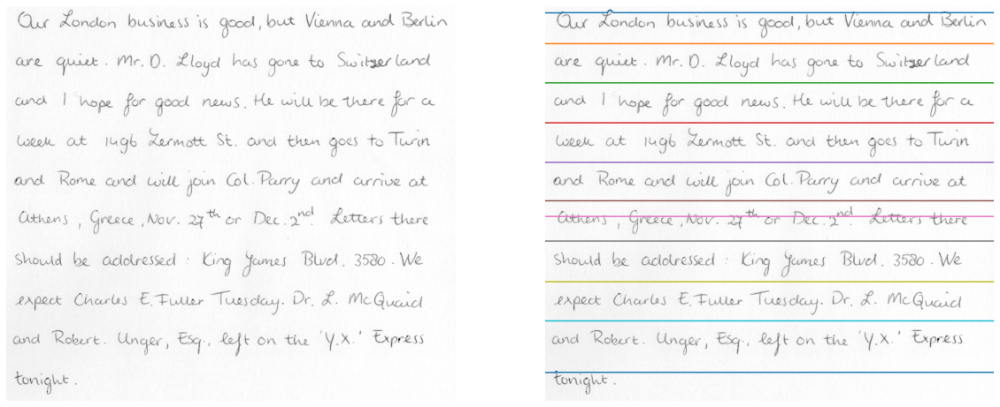

In [ ]:
offset_from_top = cluster_of_interest[0]
fig, ax = plt.subplots(figsize=(20,10), ncols=2)
for path in line_segments:
    ax[1].plot((path[:,1]), path[:,0])
ax[1].axis("off")
ax[0].axis("off")
ax[1].imshow(img, cmap="gray")
ax[0].imshow(img, cmap="gray")

In [ ]:
## add an extra line to the line segments array which represents the last bottom row on the image
last_bottom_row = np.flip(np.column_stack(((np.ones((img.shape[1],))*img.shape[0]), np.arange(img.shape[1]))).astype(int), axis=0)
line_segments.append(last_bottom_row)

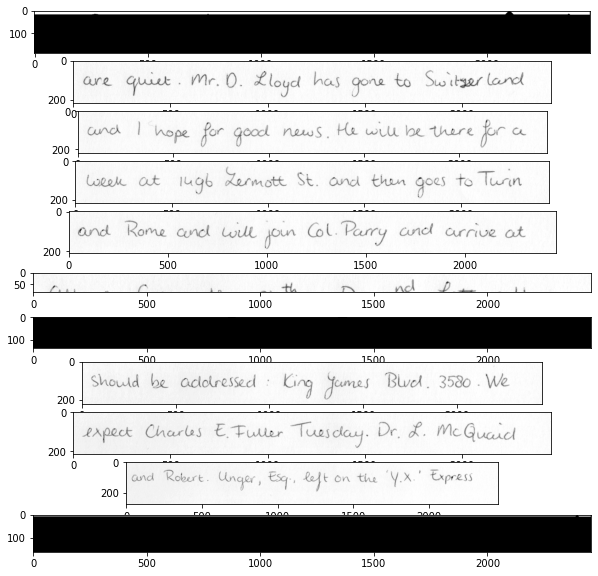

In [ ]:
line_images = []
def extract_line_from_image(image, lower_line, upper_line):
    lower_boundary = np.min(lower_line[:, 0])
    upper_boundary = np.min(upper_line[:, 0])
    img_copy = np.copy(image)
    r, c = img_copy.shape
    for index in range(c-1):
        img_copy[0:lower_line[index, 0], index] = 255
        img_copy[upper_line[index, 0]:r, index] = 255
    
    return img_copy[lower_boundary:upper_boundary, :]

line_count = len(line_segments)
fig, ax = plt.subplots(figsize=(10,10), nrows=line_count-1)
for line_index in range(line_count-1):
    line_image = extract_line_from_image(img, line_segments[line_index], line_segments[line_index+1])
    line_images.append(line_image)
    ax[line_index].imshow(line_image, cmap="gray")

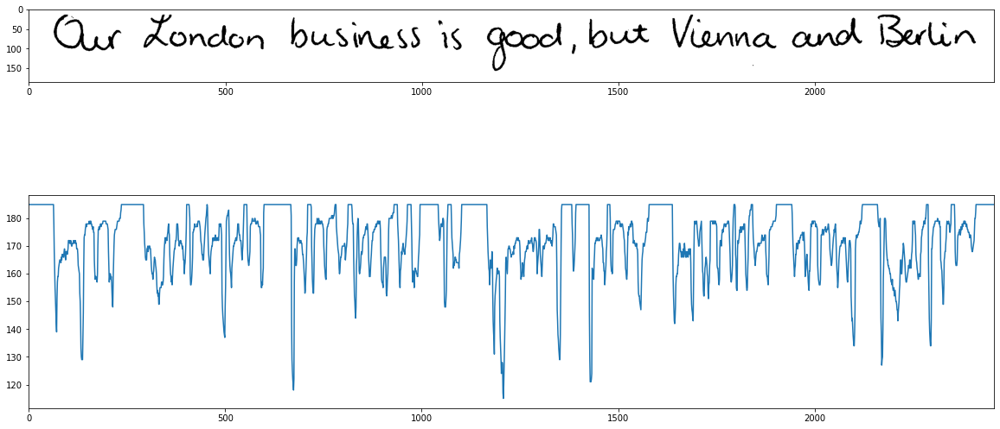

In [ ]:
from skimage.filters import threshold_otsu

#binarize the image, guassian blur will remove any noise in the image
first_line = line_images[0]
thresh = threshold_otsu(first_line)
binary = first_line > thresh

# find the vertical projection by adding up the values of all pixels along rows
vertical_projection = np.sum(binary, axis=0)

# plot the vertical projects
fig, ax = plt.subplots(nrows=2, figsize=(20,10))
plt.xlim(0, first_line.shape[1])
ax[0].imshow(binary, cmap="gray")
ax[1].plot(vertical_projection)

In [ ]:
height = first_line.shape[0]

## we will go through the vertical projections and 
## find the sequence of consecutive white spaces in the image
whitespace_lengths = []
whitespace = 0
for vp in vertical_projection:
    if vp == height:
        whitespace = whitespace + 1
    elif vp != height:
        if whitespace != 0:
            whitespace_lengths.append(whitespace)
        whitespace = 0 # reset whitepsace counter. 

print("whitespaces:", whitespace_lengths)
avg_white_space_length = np.mean(whitespace_lengths)
print("average whitespace lenght:", avg_white_space_length)

whitespaces: [64, 57, 7, 1, 8, 69, 9, 3, 10, 9, 10, 47, 9, 65, 26, 34, 7, 60, 3, 4, 40, 39, 5, 9]
average whitespace lenght: 24.791666666666668


In [ ]:
## find index of whitespaces which are actually long spaces using the avg_white_space_length
whitespace_length = 0
divider_indexes = []
for index, vp in enumerate(vertical_projection):
    if vp == height:
        whitespace_length = whitespace_length + 1
    elif vp != height:
        if whitespace_length != 0 and whitespace_length > avg_white_space_length:
            divider_indexes.append(index-int(whitespace_length/2))
            whitespace_length = 0 # reset it
            
print(divider_indexes)

[32, 265, 626, 924, 1015, 1130, 1370, 1410, 1606, 1920, 2142]


In [ ]:
# lets create the block of words from divider_indexes
divider_indexes = np.array(divider_indexes)
dividers = np.column_stack((divider_indexes[:-1],divider_indexes[1:]))

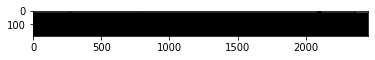

In [ ]:
plt.imshow(first_line, cmap = "gray")

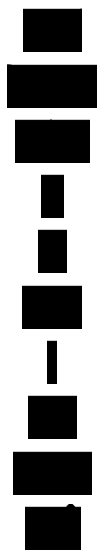

In [ ]:
# now plot the findings
fig, ax = plt.subplots(nrows=len(dividers), figsize=(5,10))
for index, window in enumerate(dividers):
    ax[index].axis("off")
    ax[index].imshow(first_line[:,window[0]:window[1]], cmap="gray")